# FORESEE: CASE STUDY #5 Madrid Calle 30 data preprocessing

<img src="FORESEElogo.png" />

## Data preprocessing for CASE STUDY #5


|   |     |
|------|------|
|  Project reference no  | 769373|
|  Deliverable no:  |  |
|  Work Package no:  | WP3,WP4, WP6|
|  Status:  | In progress|
|  Version:  | 01|
|  Authors:  | Ignacio Robles Urquijo (WSP/former LB); David Delgado Zaldivar (FERROVIAL)|
|  Date:  | 22.04.2020|
|  Nature:	  | Script|
|  Dissemination level:  | Confidential|
Disclaimer: | FORESEE has received funding from the European Union's Horizon 2020 research and innovation programme under Grant Agreement No 769373. This document reflects only the authors’ views. The European Commission and INEA are not responsible for any use that may be made of the information contained therein.|


### Document History

| Version  |  Date   |  Comments   |  Author/Reviwer   |
|------|------|------|------|
|  00  | 2020-04-14 | Draft0: provided raw traffic data from Madrid traffic counting points  | David Delgado Zaldivar (FERROVIAL) |
|  01  | 2020-04-22 | Draft1: Analysis | Ignacio Robles Urquijo (WSP, former LB) |
|  02  | 2020-05-04 | Draft2: Preprocessing & filtering | Ignacio Robles Urquijo, Gonzalo Antolin San Martin(WSP, former LB) 
|  03  | 2020-05-07 | Draft3: Adding Traffic Zones and Network | Ignacio Robles Urquijo, Gonzalo Antolin San Martin(WSP, former LB) |
|  04  | 2020-05-12 | Draft4: Extracting Traffic Data for example event | Ignacio Robles Urquijo, Gonzalo Antolin San Martin(WSP, former LB) |
|  05  | 2020-05-14 | Draft5: Extracting Incident reports| Gonzalo Antolin San Martin, Ignacio Robles Urquijo(WSP, former LB) |
|  05  | 2020-06-23 | Draft6: Adding data from the "FORESEE-WP6-Case Studies Scenario Card" | Federico di Gennaro(AIS) |
|  06  | 2020-09-18 | Draft6: provided raw traffic data field translation and explanations  | David Delgado Zaldivar (FERROVIAL) |
|   |  |  |  |

<div class="alert alert-info"><h4>Note</h4><p>Please note this document is Confidential.</p></div>

The next are the Python scripts used to preprocess the information.

In [1]:
#LIBRARIES
#!pip install geopandas
#!pip install descartes
#!pip install holidays
#!pip install xlrd
import numpy as np
import pandas as pd
import geopandas as gpd #maps
import requests, zipfile, io
import matplotlib.pyplot as plt
import matplotlib.pylab as pylab
#from matplotlib.widgets import Slider, Button, RadioButtons
from shapely.geometry import Polygon
import contextily as ctx #maps, coordiantes
from datetime import datetime, date, time, timedelta
import holidays
from scipy import ndimage
import os
import seaborn as sns
sns.set(style="ticks", color_codes=True)
%matplotlib inline
#pylab.rcParams['figure.figsize'] = 8, 6
pylab.rcParams['figure.figsize'] = 8, 8


Bad key "text.kerning_factor" on line 4 in
C:\ProgramData\Anaconda3\lib\site-packages\matplotlib\mpl-data\stylelib\_classic_test_patch.mplstyle.
You probably need to get an updated matplotlibrc file from
https://github.com/matplotlib/matplotlib/blob/v3.1.3/matplotlibrc.template
or from the matplotlib source distribution


# SCOPE

The scope of the application is to identify the areas of possible improvement of resiliency for the M-30 ring-road (Madrid) Use Case.

Extract from the WP6 document: "FORESEE_WP6_Scenario Card_CS#5.docx":
        
    Flooding and other extreme events derived from raining in the valley (in several sections of the open air section of the ring road) and the proximity of the river (tunnels in the west side) interaction with other infrastructures and buildings, and the influence of the water level in the tunnels located at the west side. Man-made events including cyberattack (to the ITS, particularly in the tunnel section), intentional or not intentional - like accidents (average number of 14 interventions/day due to accidents) or fire after accidents. 
    The disruptions in the M-30 cause delays, traffic jams and have very relevant social-economic impact that will be studied in this case study, as it affects the daily commuting of an important percentage of the city.
    Some of the data gathered includes traffic and speed of vehicles, weather data and intelligent transport systems out of service.
    The outcomes of the project will implement the advantages of real and accurate predictive maintenance strategies.


    OBJECTIVE (DoA):

    This test case will be used to test and validate the integrated framework and the expected outcomes of the project (i.e. multi-hazard cross-modal risk and resilience assessment, predictive warning system, etc.).


The next script downloads and shows the localization of the Case Study

In [4]:
#DOWNLOAD GENERIC LOCALIZATION DATA FILES for the Case Study
#https://www.ine.es/censos2011_datos/cartografia_censo2011_nacional.zip
# This link provides a 62.6MB shapefile called cartografia_censo2011_nacional.zip. Considered too detailed

#Searching for more generalized European localization shapefiles found: https://www.eea.europa.eu/data-and-maps/data/eea-reference-grids-2/gis-files/folder_listing
#https://www.eea.europa.eu/data-and-maps/data/eea-reference-grids-2/gis-files/spain-shapefile/at_download/file
# This link provides a 30MB Spain_shapefile.zip folder with different aggregation levels. Not useful

#Another official source: Eurostat/GISCO geographical
# LICENCE: EN: © EuroGeographics for the administrative boundaries
#https://ec.europa.eu/eurostat/web/gisco/geodata/reference-data/administrative-units-statistical-units
#https://ec.europa.eu/eurostat/web/gisco/geodata/reference-data/administrative-units-statistical-units/nuts#nuts16
# Metadata in metadata.pdf file. See also http://ec.europa.eu/eurostat/web/nuts/overview
# spatial type: BN/RG/LB (BN: boundaries (multilines), RG: regions (multipolygons), * LB: labels (points))
# projection: 4-digit EPSG code: 4326(WGS84,°), 3035(ETRS1989, m), 3857(WGS84 Web Mercator,m)
# subset: one of NUTS levels: LEVL_0: (countries), LEVL_1, LEVL_2, LEVL_3
url = 'https://ec.europa.eu/eurostat/cache/GISCO/distribution/v2/nuts/download/ref-nuts-2016-03m.shp.zip'
#url = 'https://ec.europa.eu/eurostat/cache/GISCO/distribution/v2/nuts/download/ref-nuts-2016-10m.shp.zip'
#url = "https://ec.europa.eu/eurostat/cache/GISCO/distribution/v2/nuts/download/ref-nuts-2016-20m.shp.zip"
#url = "https://ec.europa.eu/eurostat/cache/GISCO/distribution/v2/nuts/download/ref-nuts-2016-60m.shp.zip"
Zipfilename = 'ref-nuts-2016-03m.shp.zip'
#Zipfilename = 'ref-nuts-2016-10m.shp.zip'
#Zipfilename = 'ref-nuts-2016-20m.shp.zip'
#Zipfilename = 'ref-nuts-2016-60m.shp.zip'
shapefile_name_startswith_str = 'NUTS_RG_03M_2016_3857_LEVL_2'

if not os.path.isfile(Zipfilename): #Check if file already downloaded, if not download and save
    print("Downloading File...")
    # Downloading with requests library binary format
    response = requests.get(url, timeout=50, stream =True) #, auth=('myusername', 'mypassword')
    check = zipfile.is_zipfile(io.BytesIO(response.content))
    while not check:
        response = requests.get(url, timeout=50, stream =True)
        check = zipfile.is_zipfile(io.BytesIO(r.content))
    else: #Save the file
        if response.status_code == 200: # 200 means a successful request
            # open method to open a file on your system and write the contents
            #with open(Zipfilename, 'wb') as f: f.write(response.content)
            #to void calling content on large requests, which would require it to all be processed at once, 
            #clogging the memory. The stream avoids this by iterating through the data one chunk at a time.
            handle = open(Zipfilename, "wb")
            for chunk in response.iter_content(chunk_size=512):
                if chunk:  # filter out keep-alive new chunks
                    handle.write(chunk)
            handle.close()
else:
    print("File already exist.")

#Unzip the objective: Create a ZipFile Object and load sample.zip in it
with zipfile.ZipFile(Zipfilename, 'r') as zipObj:
    print("Unzipping shapefile.")
    # Get a list of all archived file names from the zip
    listOfFileNames = zipObj.namelist()
    # Iterate over the file names
    for fileName in listOfFileNames:
       # Check fileName endswith csv
       if fileName.startswith(shapefile_name_startswith_str): #startswith(str, beg=0,end=len(string))
            # Extract a single file from zip
            zipObj.extract(fileName, 'data_subset')
            if fileName.endswith('.zip'): #unzip again if needed
                with zipfile.ZipFile('data_subset/'+fileName, 'r') as zip: 
                    # printing all the contents of the zip file 
                    zip.printdir() 
                    # extracting all the files 
                    print('Extracting all the files now...') 
                    zip.extractall('data_subset') 

# Preparing the localization data: Loading geodataframes
for root, dirs, files in os.walk('data_subset'):
    for file in files:
        if (file.startswith(shapefile_name_startswith_str) and
            file.endswith('.shp')):
            print(file)
            gdf_country = gpd.read_file('./data_subset/'+file)

#Convert the geodataframes coordinates
gdf_country_4326 = gdf_country.to_crs(epsg=4326)

Unzipping shapefile.
File Name                                             Modified             Size
NUTS_RG_03M_2016_3857_LEVL_2.cpg               2020-02-12 23:13:36            5
NUTS_RG_03M_2016_3857_LEVL_2.dbf               2020-02-12 23:13:36        25522
NUTS_RG_03M_2016_3857_LEVL_2.prj               2020-02-12 23:13:36          425
NUTS_RG_03M_2016_3857_LEVL_2.shp               2020-02-12 23:13:36      1569528
NUTS_RG_03M_2016_3857_LEVL_2.shx               2020-02-12 23:13:36         2756
Extracting all the files now...
NUTS_RG_03M_2016_3857_LEVL_2.shp


In [5]:
#LOAD SPECIFIC LOCALIZATION DATA FILES for the Case Study
# The network dataset was developed by WSP specifically for the FORESEE case study using the traffic tool
# PTV VISUM and and exported to a generic GIS shapefile format.

# Loading CASE STUDY Traffic Model geodataframes
gdf_TM_network_link = gpd.read_file('./data_subset/network_link.shp')
gdf_TM_network_link_4326 = gdf_TM_network_link.to_crs(epsg=4326)
#print ("gdf_TM_network_link",gdf_TM_network_link.columns)

C:\ProgramData\Anaconda3\lib\site-packages\geopandas\plotting.py:335: UserWarning: The GeoSeries you are attempting to plot is empty. Nothing has been displayed.
  UserWarning,


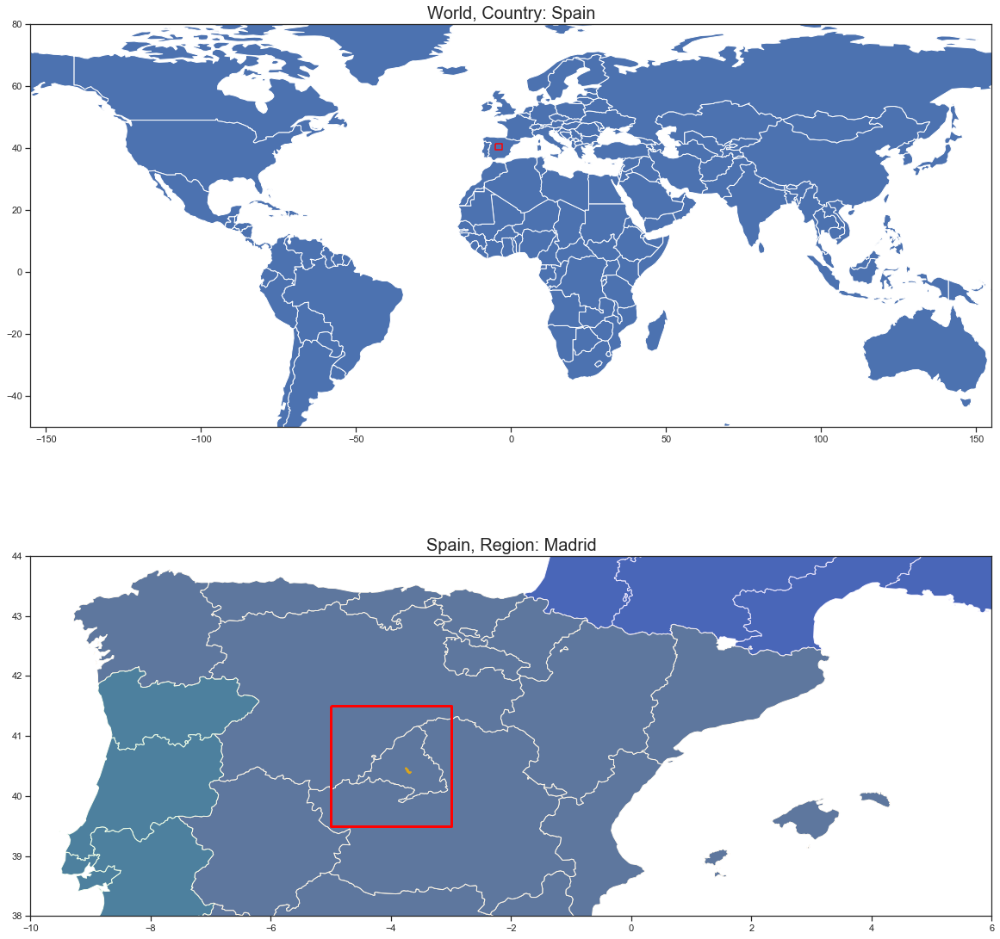

In [9]:
#LOCALIZATION PLOT
# World map data
world = gpd.read_file(gpd.datasets.get_path("naturalearth_lowres"))

# Create a subset of the world data that includes Country and Region
country_name = "Spain"
region_name = "Madrid"
country = world[world["name"] == country_name]
#surrounding= world[world["name"].isin(["Portugal", "France"])]   
regions= gdf_country_4326[gdf_country_4326["NUTS_NAME"].isin([region_name])] 

# Create a custom highlighting polygon
#polygon = Polygon([(-6, 45), (-2, 45), (-2, 42), (-6, 42)])#around Cantabria
#polygon = Polygon([(-6, 42), (-2, 42), (-2, 39), (-6, 39)])#around Madrid
polygon = Polygon([(-5, 41.5), (-3, 41.5), (-3, 39.5), (-5, 39.5)])#around Madrid
poly_gdf = gpd.GeoDataFrame([1], geometry=[polygon], crs=world.crs)

#fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 15))
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(20, 20))
ax1.set_xlim(-155, 155.0)
ax1.set_ylim(-50.0, 80.0)
world.plot(ax=ax1)
poly_gdf.boundary.plot(ax=ax1, color="red")

ax2.set_xlim(-10.0, 6.0)
ax2.set_ylim(38, 44.0)
#world.plot(ax=ax2)
#country.boundary.plot(ax=ax2, color="green")
#surrounding.boundary.plot(ax=ax2, color="lightgreen")

poly_gdf.boundary.plot(ax=ax2, color="red", linewidth=3)
#gdf_country_4326.plot(ax=ax2, alpha=0.2,edgecolor='k', cmap="prism")
gdf_country_4326.plot(ax=ax2)
regions.boundary.plot(ax=ax2, linewidth=1, color="lightgreen")
gdf_TM_network_link_4326.plot(ax=ax2, edgecolor='goldenrod')

gdf_country_4326.plot(ax=ax2, alpha=0.1,edgecolor='w', column='CNTR_CODE', cmap="prism")
                      
ax1.set_title("World, Country: "+ country_name, fontsize=20)
ax2.set_title(country_name+", Region: "+region_name, fontsize=20)
#ax1.set_axis_off()
#ax2.set_axis_off()
plt.show()

# REPORTS

On April 14th 2020 Case Study #5 made available the historical traffic data available for Madrid city and M-30 for the last 7 years. The information also included a document with the precise location of all counting points. 

The initial analysis of the compress raw data showed that the files contain the next:

 * 15min Traffic data from 2014-01-01 till 2020-03-31 (6.44GB)
 * Coverage of 4276 Traffic Counting Points (TCP) for a much wider area than the Area of Interest (Madrid city instead of AoI around the tunnels), including the highway (M30) and the urban roads (URB)
 * The raw data includes the next fields: "id,	fecha,	tipo_elem,	intensidad,	ocupacion,	carga,	vmed,	error,	periodo_integracion"
   - id: Identification of the counting point
   - fecha: date
   - tipo_elem: type of element
   - intensidad: traffic volume
   - ocupacion: ocupation
   - carga: load
   - vmed: average speed
   - error: error
   - periodo_integracion: integration period
        
    

The next table was provided as explanation by FERROVIAL

| Column  |  Range / Distinct Values   |  Comment   |  Clarification   |
|------|------|------|------|
|  idelem/id  |  | Not in all years available | ID of the counting point. This might vary as they are installed or removed depending on the year. 3581  |
|  Fecha  |  | Date and time of measurement | OK |
|  Identif  |  | ID of the TCP | There are two identification numbers per counting point. Should be consistent with  with idelem. For example idelem 3581 is the same as identif 61079. All counting points with identif starting by PM are in the M-30. This code means: 1st digit [•	1 internal carriageway, •	2 external carriageway, •	3 towards Madrid, •	4 outwards Madrid]; 3 next digits: •	Kimetric point: for example: 045 means kimetric point 4+500 or 123 means kilometric pint 12+300; Last digit: [•	1 main carriageway, •	2 service lanes, •	3-8 junction, acceses…]. Other format also belonging to the M-30 is for example 05TL00PM02. 1st digit is the km. In the previous example is km 5. 2 leters is the identification of the junction. 2 nect digits is the number of meters after the km. Therefore, in the previous example 5+000. PM01, PM02…numbering if there are more than one at the same location|
|  Tipo  | Values=[null, Z, E, D, C, M, G, F] | What do the characters stand for? (Type) | Unknown. Irrelevant |
|  Tip_elem  | Values = [494, null, PUNTOS MEDIDA URBANOS, M30, 495, PUNTOS MEDIDA M-30, URB] | Which Road the TCP belongs to | OK. M-30 or others mainly |
|  Intensidad  | 1000 distinct values; Range=[0, 99999] | (Intensity)| Traffic volume. Number of vehicles in that period of time passing by the counting point. The unit in this column is vehicles/hour |
|  Occupation  | 202 distinct values; Range=[-1, 999] | (Occupation) | % of time in which the counting point is detecting a vehicle. Ratio of time in which there is a vehicle on top of the counting point |
|  Carga  | 418 distinct values; Range=[0, 9264] | (Load) | Unknown. Irrelevant |
|  Vmed  | 186 distinct values; Range=[-1, 237] | Average speed at TCP  | OK |
|  Error | Values=[null, N, S, E] | (Error) | If the counting point is working or not. N (no) S (yes) E (error)  |
|  Period_integracion | 413 distinct values; Range=[1, 35922] | (Integration period) | Unknown. Irrelevant |
|   |  |  |  |

In [10]:
%%html
<a href="https://datos.madrid.es/sites/v/index.jsp?vgnextoid=33cb30c367e78410VgnVCM1000000b205a0aRCRD&vgnextchannel=374512b9ace9f310VgnVCM100000171f5a0aRCRD"> Found the link to the source for the historical traffic CVS files from 2013 onwards </a>


In [11]:
#Analysis of the Location files for the Traffic Counting Points. 
gdf = gpd.read_file('./data/pmed_ubicacion_03-2020/pmed_ubicacion_03-2020.shp')
print (gdf)
print (gdf.columns)

     tipo_elem  distrito     id cod_cent  \
0          URB      16.0   6108    47407   
1          URB      18.0   5226    82409   
2          M30      13.0  10178  PM20948   
3          M30       9.0   6697  PM22502   
4          M30       5.0   6661  PM40463   
...        ...       ...    ...      ...   
4271       URB       9.0   4332    16065   
4272       URB      21.0  10002    57023   
4273       URB      18.0   5368    88017   
4274       URB      18.0   5369    88018   
4275       URB      11.0  10254    96002   

                                                 nombre          utm_x  \
0            C/. Golfo de Salónica  - Espliego-San Luis  443590.928366   
1     Cno. Hormigueras - Cno. Hormigueras (Entrevias...  444682.993308   
2                                               PM20948  443492.678763   
3                                               PM22502  436352.519328   
4                                               PM40463  443726.024798   
...                        

   
The **Traffic Counting Points (TCP)** location files contain data about the :

 * ``'tipo_elem'``: type of TCP :  URB (Urban Road TCP) or M30 (M30 highway TCP)
 * ``'distrito'`` : District number
 * ``'id'`` : TCP identification code
 * ``'cod_cent'`` : unidentified code
 * ``'nombre'``: alphanumeric name of the TCP containing : street (URB) or code for the M30
 * ``'utm_x'`` : Location Coordinate X (Projected coordinate systems, m, ETRS_1989_UTM_Zone_30N) 
 * ``'utm_y'`` : Location Corrdinate Y (Projected coordinate systems, m, ETRS_1989_UTM_Zone_30N)
 * ``'longitud'`` : Location Coordinate X (Geographic coordinate systems, angles, GCS_ETRS_1989)
 * ``'latitud'``  : Location Corrdinate Y (Geographic coordinate systems, angles, GCS_ETRS_1989)
 * ``'geometry'`` : Arrow POLYGON indicating direction for the TCP

UTM coordinates are *Projected coordinate systems*. Projected coordinate systems are defined on a flat, two-dimensional surface, with constant lengths, angles, and areas across the two dimensions. UTM is a flat projection of a geographic coordinate system based on a sphere or spheroid. Therefore uses a linear unit of measure (meter).

Longitud and Latitiude are *Geographic coordinate systems (GCS)*. GCS uses a three-dimensional spherical surface to define locations on the earth. A GCS includes an angular unit of measure, a prime meridian, and a datum (based on a spheroid). The spheroid defines the size and shape of the earth model, while the datum connects the spheroid to the earth's surface.

Given the scale, the required accuracy and the vectorized nature of the data, it is genarally agreed to preffer the geographic coordinate systems when possible. Therefore we will try to use the GCS location info.


In [12]:
#Creating a GeoDataFrame from a DataFrame with coordinates of the Traffic Counting Points (TCP). 
#https://geopandas.readthedocs.io/en/latest/gallery/create_geopandas_from_pandas.html
#gdf_2 = gpd.GeoDataFrame(gdf, geometry=gpd.points_from_xy(gdf.utm_x, gdf.utm_y)) #generarly better from coordinates
gdf_2 = gpd.GeoDataFrame(gdf, geometry=gpd.points_from_xy(gdf.longitud, gdf.latitud))

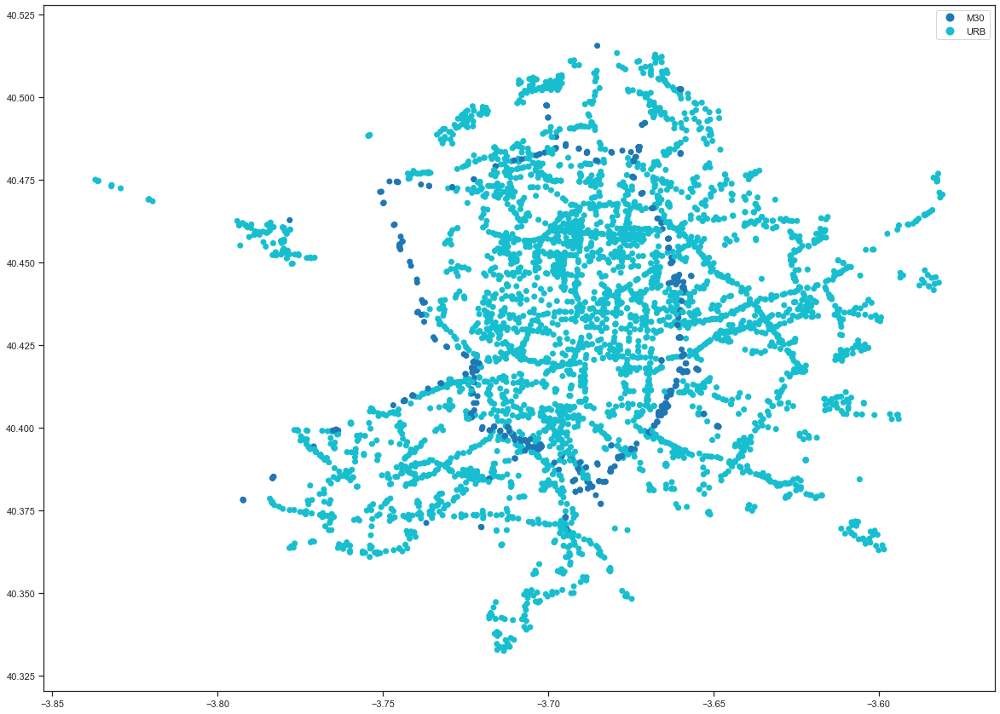

In [13]:
#Displaying the GeoDataFrame of Traffic Counting Points. 
%matplotlib inline
#gdf.plot()
#gdf.plot(column='id', cmap=None)
gdf_2.plot(column='tipo_elem', cmap=None, legend=True, figsize=(20, 20))

In [14]:
# Loading a roadmap of MADRID to understand where the TCP are
gdf_roads = gpd.read_file('./Road_Map_Madrid/Viario_MADRID.shp')

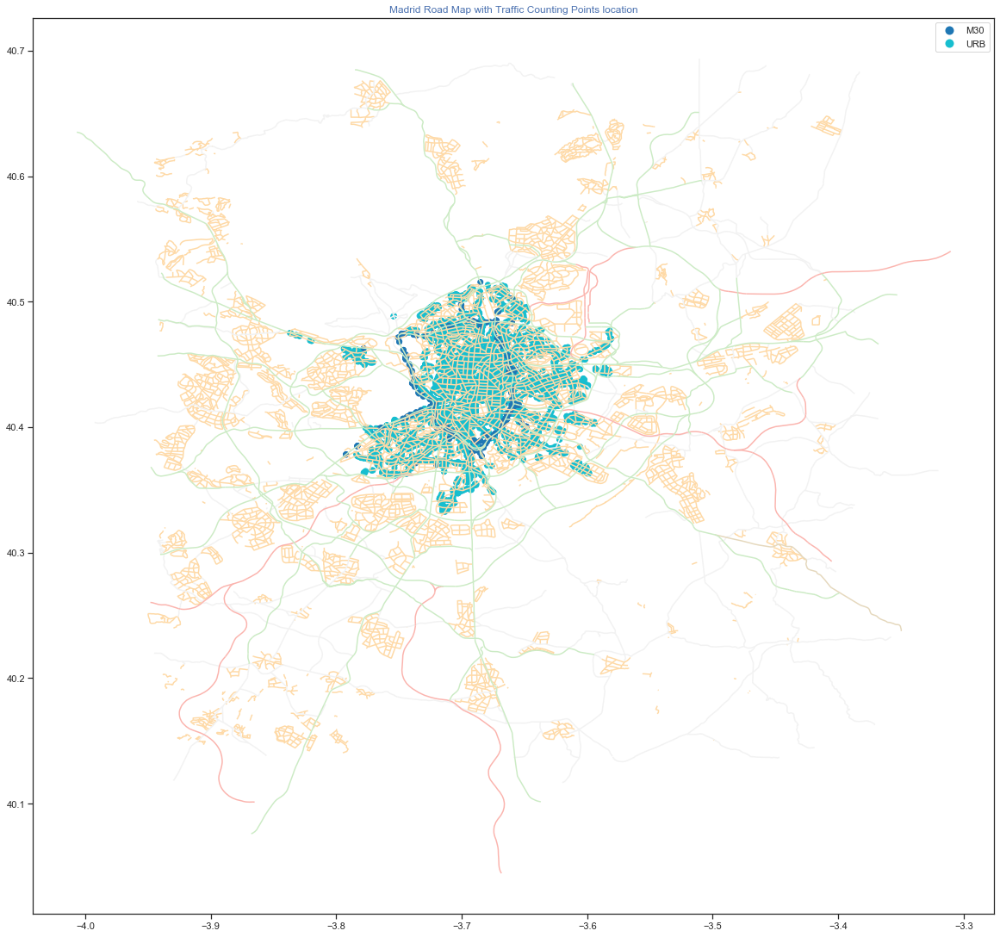

In [15]:
#Displaying the RoadMap and the Traffic Counting Points. 
#import matplotlib.pyplot as plt
f, ax = plt.subplots(1, figsize=(20, 20))
ax.set_title('Madrid Road Map with Traffic Counting Points location'.format('default'), color='C0')
gdf_roads.plot(ax=ax, column='Tipo', cmap="Pastel1", legend=True)#color='C1')
gdf_2.plot(ax=ax, column='tipo_elem', cmap=None, legend=True)
plt.show()

From this graph we can observe that the traffic countng points are located in the center of Madrid, and that the urban road (``URB``) Traffic Counting Points(TCP) are distiguished from the ``M30`` highway TCP.

In [16]:
# Loading a smaller roadmap RoadMap2 of MADRID to understand where the TCP are
gdf_roads2 = gpd.read_file('./Road_Map_Madrid/RoadMap_MADRID.shp')

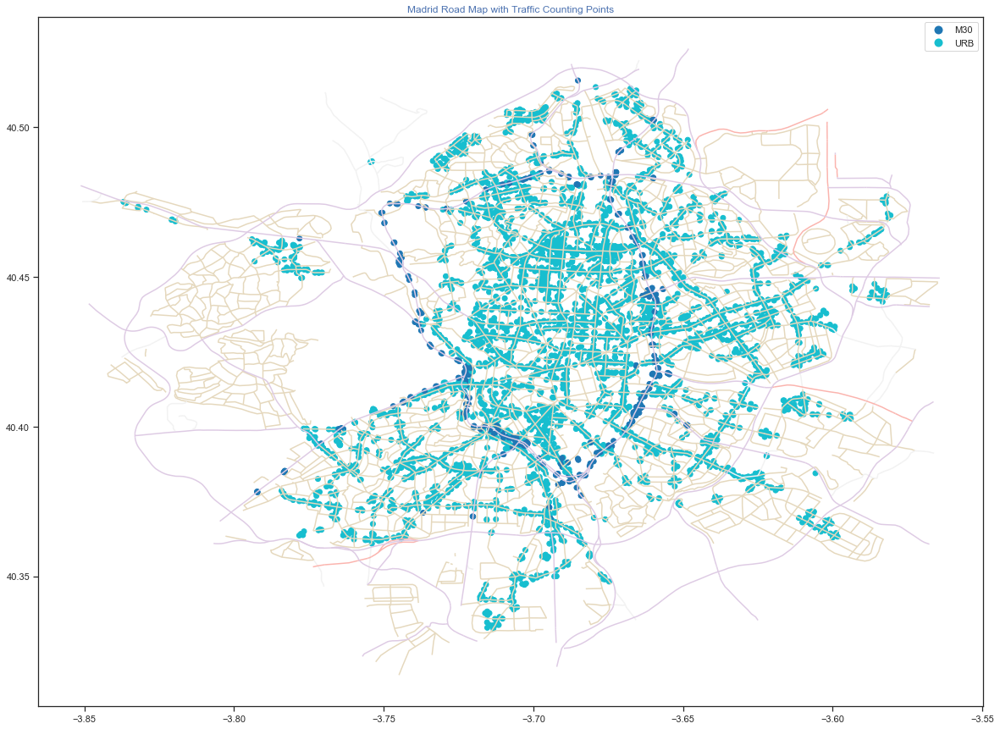

In [17]:
#Displaying the RoadMap2 and the Traffic Counting Points. 
f, ax = plt.subplots(1, figsize=(20, 20))
ax.set_title('Madrid Road Map with Traffic Counting Points'.format('default'), color='C0')
  
gdf_roads2.plot(ax=ax, column='Tipo', cmap="Pastel1", legend=True)#color='C1')
gdf_2.plot(ax=ax, column='tipo_elem', cmap=None, legend=True)
plt.show()

Based on the initial convesation with FERROVIAL the Area of Interest involves two tunnels under the "Manzanares" river .

In [18]:
# Loading a smaller set of Traffic Counting Points of the Area of Interest. 
gdf_TCPsub = gpd.read_file('./data_subset/subset_TCP_location.shp')
gdf_TCP2 = gpd.GeoDataFrame(gdf_TCPsub, geometry=gpd.points_from_xy(gdf_TCPsub.longitud, gdf_TCPsub.latitud))

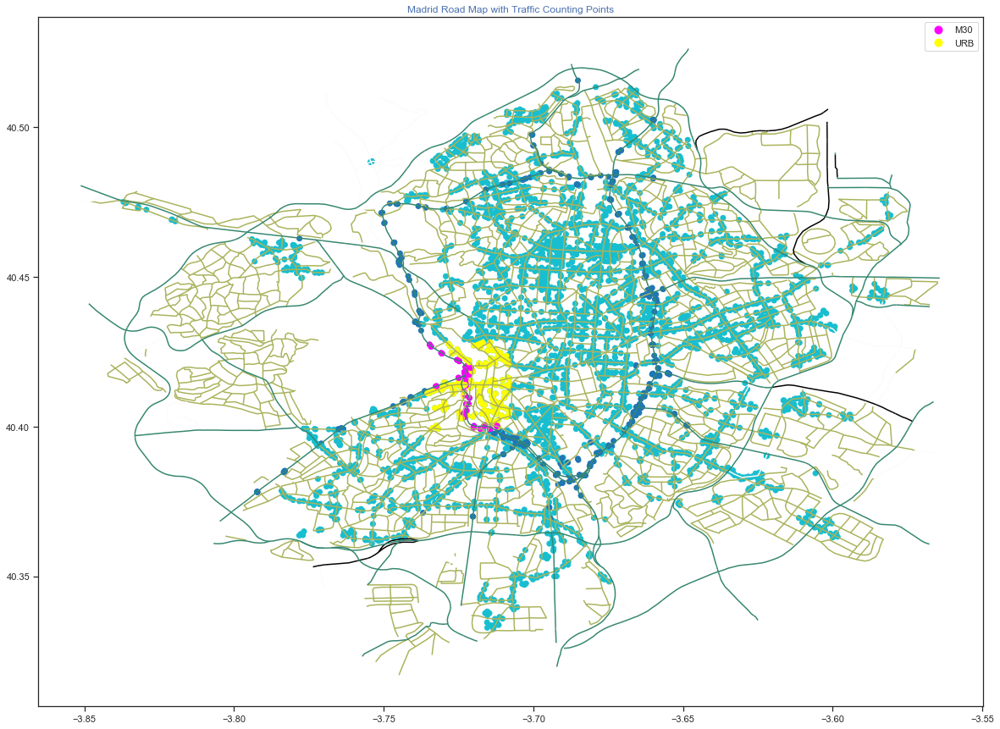

In [19]:
#Displaying the RoadMap2,  the Traffic Counting Points, and the Area of Interest. 
f, ax = plt.subplots(1, figsize=(20, 20))
ax.set_title('Madrid Road Map with Traffic Counting Points'.format('default'), color='C0')

gdf_roads2.plot(ax=ax, column='Tipo', cmap="gist_earth", legend=True)#color='C1')#cmap="Pastel1"
gdf_2.plot(ax=ax, column='tipo_elem', cmap=None, legend=True)
gdf_TCP2.plot(ax=ax, column='tipo_elem', cmap="spring", legend=True)#cmap="tab20b"
plt.show()

Performed a Traffic Analysis of the Area of Interest.
 - Identified the under river **Tunnels** that might be affected by the CS#5 risks
 - Identified the **roads** that might be alternatives to the tunnels
 - Created a poligon to mark the **Area of Interest** with all potential Traffic Counting Points that will affect such roads

In [20]:
# Area of Interest , based on the analysis of the Traffic 
gdf_TCPsub = gpd.read_file('./data_subset/Area.shp')
#gdf_TCP2 = gpd.GeoDataFrame(gdf_TCPsub, geometry=gpd.points_from_xy(gdf_TCPsub.longitud, gdf_TCPsub.latitud))
print (gdf_TCPsub.columns)

Index(['id', 'geometry'], dtype='object')


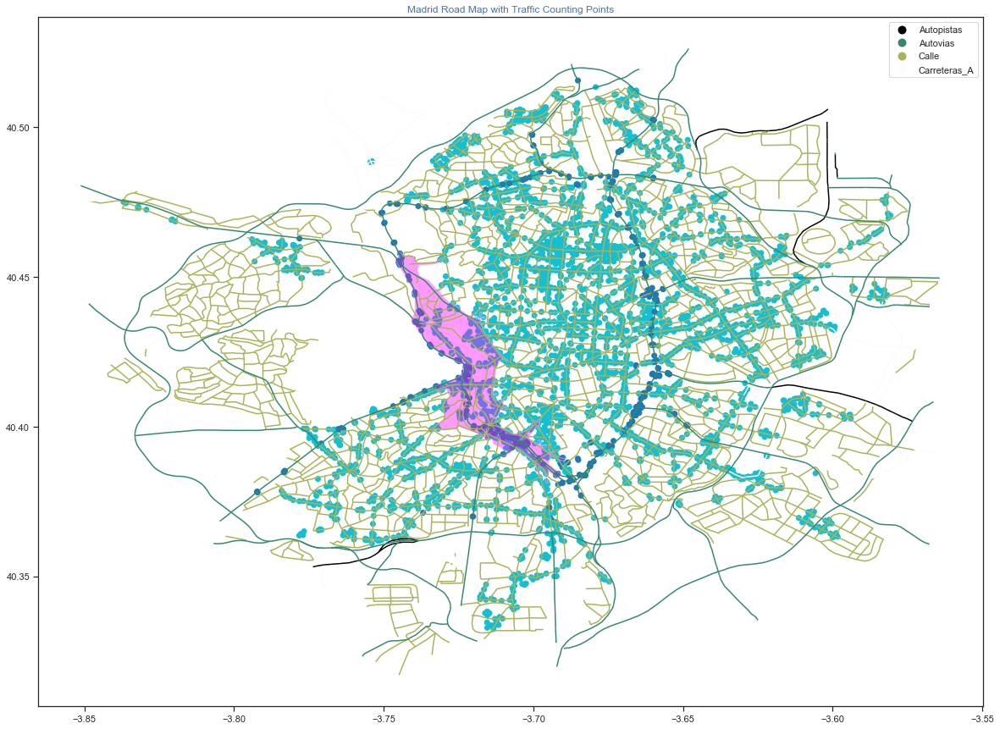

In [21]:
#Displaying the RoadMap3,  Area of Interest 
f, ax = plt.subplots(1, figsize=(20, 20))
ax.set_title('Madrid Road Map with Traffic Counting Points'.format('default'), color='C0')
gdf_roads2.plot(ax=ax, column='Tipo', cmap="gist_earth", legend=True)#color='C1')#cmap="Pastel1"
gdf_2.plot(ax=ax, column='tipo_elem', cmap=None)
gdf_TCPsub.plot(ax=ax, column='id', cmap="spring", alpha=0.4)#
plt.show()

Performed a Traffic Analysis of the **ZONEs and NETWORK** to use.
 - Identified the **Zones** of interest contributing to the traffic over the Area of Interest
     - external zones,  both municipal and out-of-the-region origin and destination zones
     - internal zones with different levels of detail, depending on the distance to the roads of interest
 - Aggregated the zones from Madrid Mobility Survey acording to the case study **Zones** of interest and placed the **Centroids**.
 - Imported and edited the **Road network** from Open Sreet map, based on the traffic flows permited in the Area of Interest. Checked continiuty and edited links and nodes.
 - Added **Connectors** betwee the zone centroids and the network roads

In [22]:
# Loading Traffic Model geodataframes
gdf_TM_network_link = gpd.read_file('./data_subset/network_link.shp')
gdf_TM_network_node = gpd.read_file('./data_subset/network_node.shp')

gdf_TM_network_zone = gpd.read_file('./data_subset/network_zone.shp')
gdf_TM_network_zone_centroid = gpd.read_file('./data_subset/network_zone_centroid.shp')

gdf_TM_network_connector = gpd.read_file('./data_subset/network_connector.shp')

gdf_TM_network_area = gpd.read_file('./data_subset/network_area.shp')
gdf_TM_network_area_centroid = gpd.read_file('./data_subset/network_area_centroid.shp')

print ("gdf_TM_network_link",gdf_TM_network_link.columns)
print ("gdf_TM_network_node",gdf_TM_network_node.columns)

print ("gdf_TM_network_zone",gdf_TM_network_zone.columns)
print ("gdf_TM_network_zone_centroid",gdf_TM_network_zone_centroid.columns)

print ("gdf_TM_network_connector",gdf_TM_network_connector.columns)

print ("gdf_TM_network_area",gdf_TM_network_area.columns)
print ("gdf_TM_network_area_centroid",gdf_TM_network_area_centroid.columns)

gdf_TM_network_link Index(['NO', 'FROMNODENO', 'TONODENO', 'TYPENO', 'TSYSSET', 'LENGTH',
       'NUMLANES', 'CAPPRT', 'V0PRT', 'VOLVEHPR~1', 'VOLPERSP~2', 'VOLPERSW~3',
       'OSM_ELEC~4', 'OSM_GAUGE', 'OSM_LEVEL', 'OSM_MAXS~5', 'OSM_OPER~6',
       'OSM_STRU~7', 'OSM_VOLT~8', 'OSM_WAYS~9', 'OSM_WAY_ID', 'R_NO',
       'R_FROMN~10', 'R_TONODENO', 'R_TYPENO', 'R_TSYSSET', 'R_LENGTH',
       'R_NUMLANES', 'R_CAPPRT', 'R_V0PRT', 'R_VOLVE~11', 'R_VOLPE~12',
       'R_VOLPE~13', 'R_OSM_E~14', 'R_OSM_G~15', 'R_OSM_L~16', 'R_OSM_M~17',
       'R_OSM_O~18', 'R_OSM_S~19', 'R_OSM_V~20', 'R_OSM_W~21', 'R_OSM_W~22',
       'geometry'],
      dtype='object')
gdf_TM_network_node Index(['NO', 'CODE', 'NAME', 'TYPENO', 'XCOORD', 'YCOORD', 'T0PRT', 'VOLPRT',
       'OSM_NODE~1', 'geometry'],
      dtype='object')
gdf_TM_network_zone Index(['NO', 'CODE', 'NAME', 'TYPENO', 'geometry'], dtype='object')
gdf_TM_network_zone_centroid Index(['NO', 'CODE', 'NAME', 'TYPENO', 'geometry'], dtype='object')
gdf_T

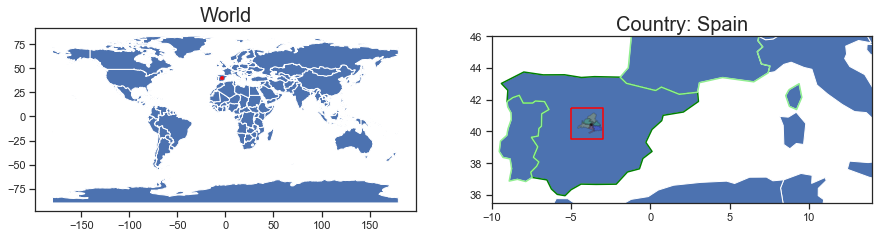

In [23]:
#LOCALIZATION 2 showing the zonification
# World map data
world = gpd.read_file(gpd.datasets.get_path("naturalearth_lowres"))

# Create a subset of the world data that is just the Country
country_name = "Spain"
country = world[world["name"] == country_name]
surrounding= world[world["name"].isin(["Portugal", "France"])]   

# Create a custom polygon
#polygon = Polygon([(-8, 44), (1, 44), (1, 37), (-8, 37)])
polygon = Polygon([(-5, 41.5), (-3, 41.5), (-3, 39.5), (-5, 39.5)])#around Madrid
poly_gdf = gpd.GeoDataFrame([1], geometry=[polygon], crs=world.crs)

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 15))
world.plot(ax=ax1)
poly_gdf.boundary.plot(ax=ax1, color="red")

ax2.set_xlim(-10.0, 14.0)
ax2.set_ylim(35.5, 46.0)
world.plot(ax=ax2)
country.boundary.plot(ax=ax2, color="green")
surrounding.boundary.plot(ax=ax2, color="lightgreen")
poly_gdf.boundary.plot(ax=ax2, color="red")
gdf_TM_network_zone.plot(ax=ax2, alpha=0.2,edgecolor='k', column='NO', cmap="prism")

ax1.set_title("World", fontsize=20)
ax2.set_title("Country: "+ country_name, fontsize=20)
#ax1.set_axis_off()
#ax2.set_axis_off()
plt.show()

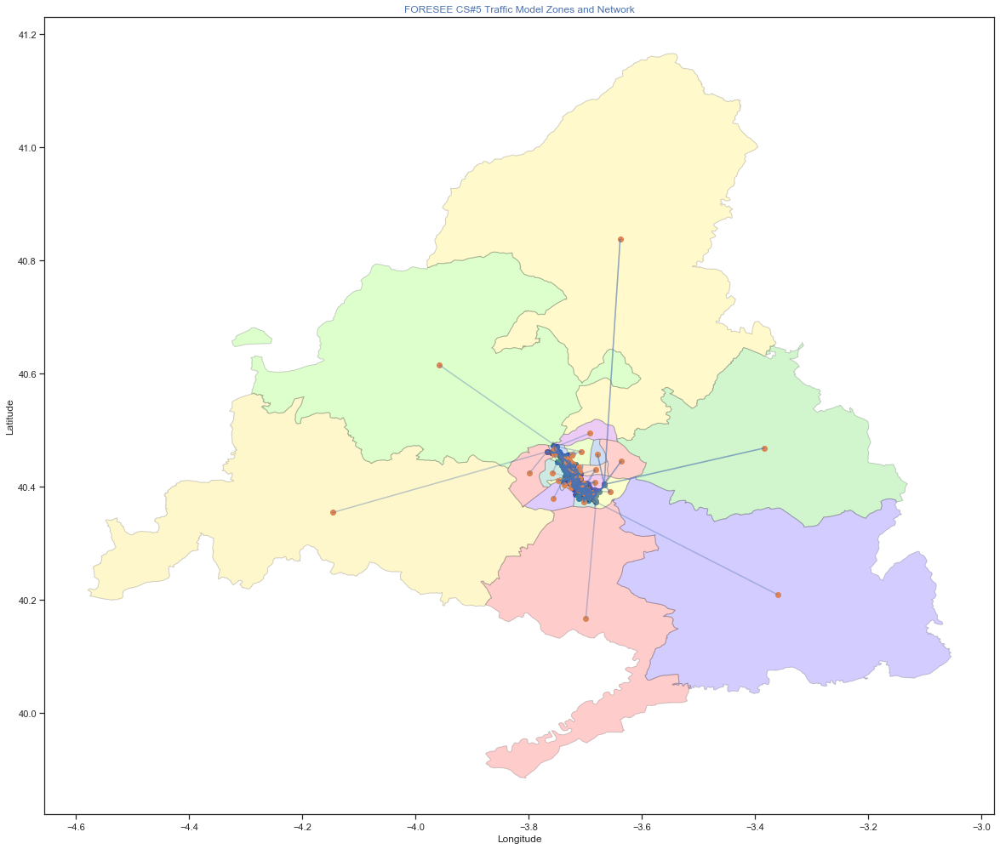

In [24]:
#Displaying the Traffic Model geodataframes for Zones and Network
f, ax = plt.subplots(1, figsize=(20, 20))
ax.set_title('FORESEE CS#5 Traffic Model Zones and Network'.format('default'), color='C0')
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')
gdf_TM_network_link.plot(ax=ax)#, column='Tipo', cmap="Pastel1", legend=True)#color='C1')
gdf_TM_network_node.plot(ax=ax)

gdf_TM_network_zone.plot(ax=ax, alpha=0.2,edgecolor='k', column='NO', cmap="prism")
gdf_TM_network_zone_centroid.plot(ax=ax)

gdf_TM_network_connector.plot(ax=ax, alpha=0.2)

#gdf_TM_network_area.plot(ax=ax, alpha=0.4)
#gdf_TM_network_area_centroid.plot(ax=ax)

#ctx.add_basemap(ax)

plt.show()

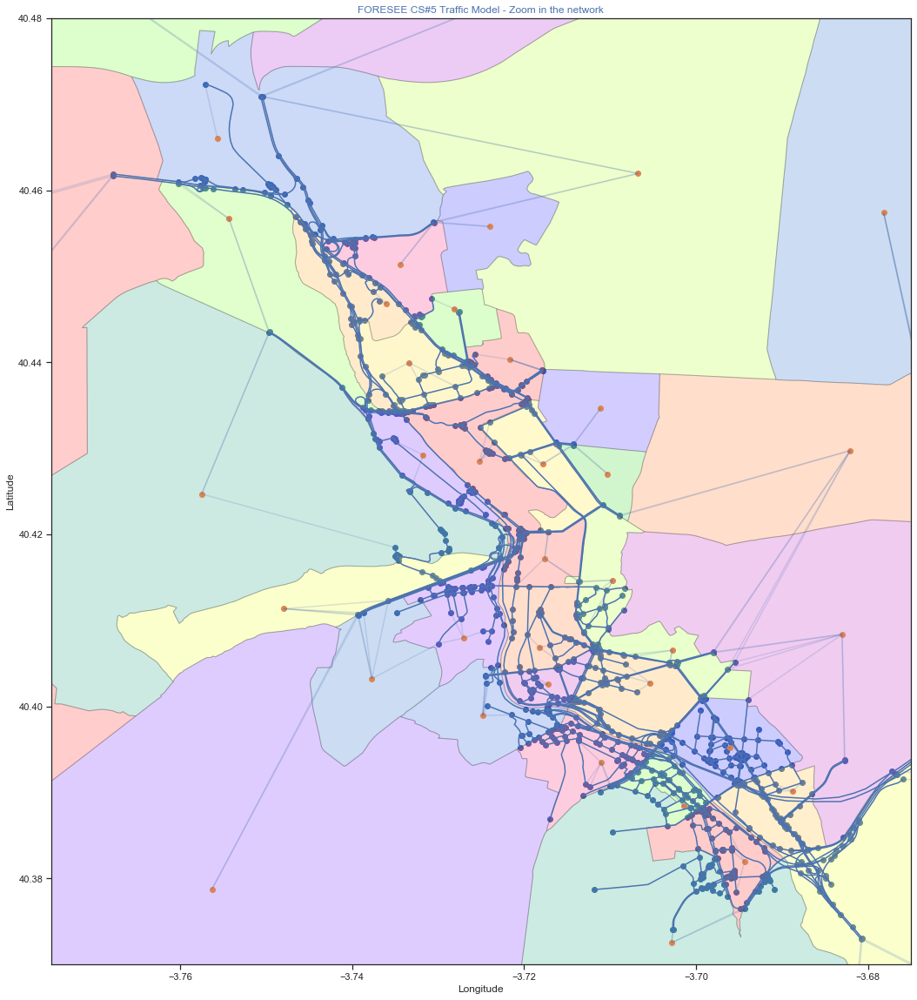

In [25]:
#Displaying the Traffic Model geodataframes (zoomed in the network)
f, ax = plt.subplots(1, figsize=(20, 20))

ax.set_title('FORESEE CS#5 Traffic Model - Zoom in the network'.format('default'), color='C0')
#ax.margins(x=-0.35, y=-0.35)# zooms in to center
ax.set_xlim(-3.775, -3.675)#(-3.8, -3.6)
ax.set_ylim(40.37, 40.48)#(40.35, 40.5)
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')

gdf_TM_network_link.plot(ax=ax)#, column='Tipo', cmap="Pastel1", legend=True)#color='C1')
gdf_TM_network_node.plot(ax=ax)

gdf_TM_network_zone.plot(ax=ax, alpha=0.2,edgecolor='k', column='NO', cmap="prism")
gdf_TM_network_zone_centroid.plot(ax=ax)

gdf_TM_network_connector.plot(ax=ax, alpha=0.2)

#not in the same coordinate system
#ctx.add_basemap(ax, zoom=1)
#ctx.add_basemap(ax, source=ctx.providers.Stamen.TonerLite)
#ctx.add_basemap(ax, source=ctx.providers.Stamen.Toner, zoom=15)

plt.show()

In order not to lose track of the location of each element the traffic model network must be contextulized with a background. Therefore the coordinate system is transformed to facilitate standard coordinates. 

 - Transforming to Projected Coordinate Systems : WGS 1984 Web Mercator = (EPSG 3857)

In [26]:
#Convert the data to Web Mercator
#Web map tiles are typically provided in Web Mercator (EPSG 3857)
#, so we need to make sure to convert our data first to the same CRS
#to combine our polygons and background tiles in the same map
gdf_TM_network_link_3857 = gdf_TM_network_link.to_crs(epsg=3857)
gdf_TM_network_node_3857 = gdf_TM_network_node.to_crs(epsg=3857)
gdf_TM_network_zone_3857 = gdf_TM_network_zone.to_crs(epsg=3857)
gdf_TM_network_zone_centroid_3857 = gdf_TM_network_zone_centroid.to_crs(epsg=3857)
gdf_TM_network_connector_3857 = gdf_TM_network_connector.to_crs(epsg=3857)

ConnectionError: HTTPSConnectionPool(host='stamen-tiles-a.a.ssl.fastly.net', port=443): Max retries exceeded with url: /terrain/9/250/193.png (Caused by NewConnectionError('<urllib3.connection.VerifiedHTTPSConnection object at 0x00000114F96F6320>: Failed to establish a new connection: [WinError 10060] A connection attempt failed because the connected party did not properly respond after a period of time, or established connection failed because connected host has failed to respond'))

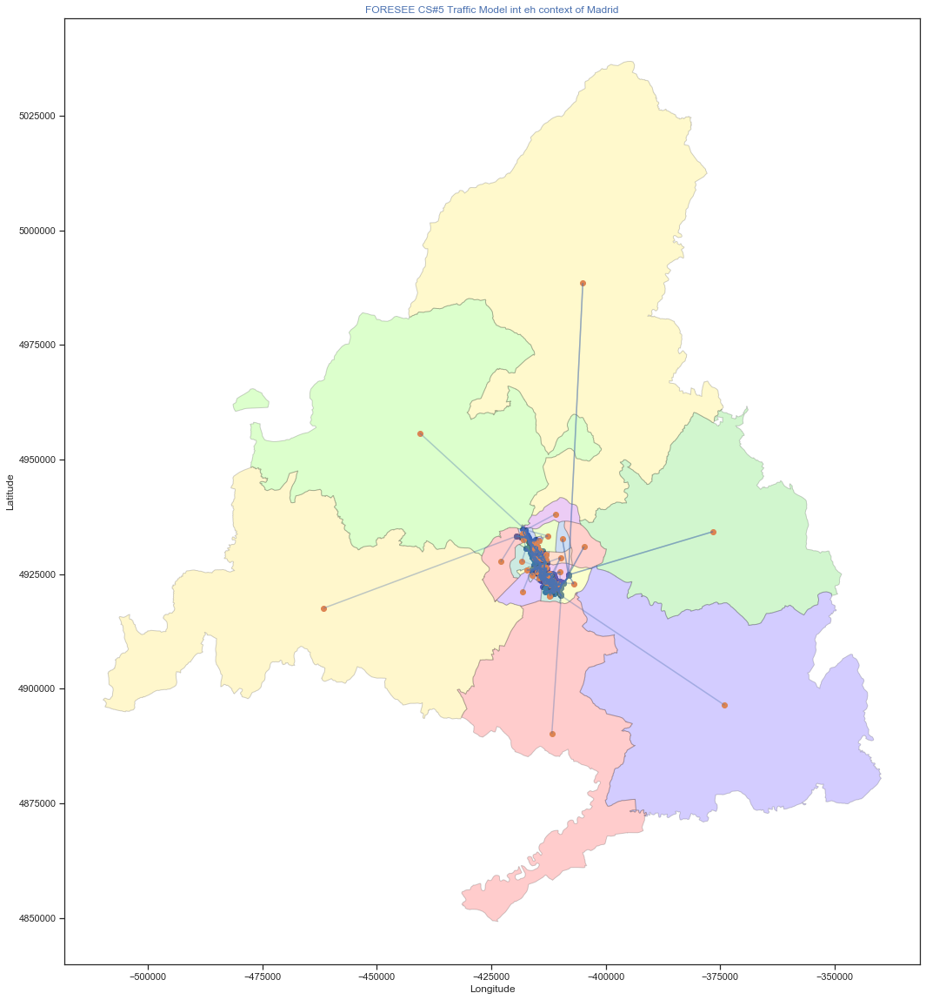

In [30]:
#Displaying the Traffic Model geodataframes with context
f, ax = plt.subplots(1, figsize=(20, 20))
ax.set_title('FORESEE CS#5 Traffic Model int eh context of Madrid'.format('default'), color='C0')
#ax.set_xlim(-7.0, 0)
#ax.set_ylim(38.0, 43.0)
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')
gdf_TM_network_link_3857.plot(ax=ax)#, column='Tipo', cmap="Pastel1", legend=True)#color='C1')
gdf_TM_network_node_3857.plot(ax=ax)

gdf_TM_network_zone_3857.plot(ax=ax, alpha=0.2,edgecolor='k', column='NO', cmap="prism")
gdf_TM_network_zone_centroid_3857.plot(ax=ax)

gdf_TM_network_connector_3857.plot(ax=ax, alpha=0.2)

#gdf_TM_network_area.plot(ax=ax, alpha=0.4)
#gdf_TM_network_area_centroid.plot(ax=ax)

ctx.add_basemap(ax)
#ctx.add_basemap(ax, url=ctx.providers.Stamen.TonerLite)

plt.show()

Displaying the Traffic Model geodataframes ZOOM at **network level**

ConnectionError: HTTPSConnectionPool(host='stamen-tiles-a.a.ssl.fastly.net', port=443): Max retries exceeded with url: /terrain/12/2004/1543.png (Caused by NewConnectionError('<urllib3.connection.VerifiedHTTPSConnection object at 0x00000114FB528F28>: Failed to establish a new connection: [WinError 10060] A connection attempt failed because the connected party did not properly respond after a period of time, or established connection failed because connected host has failed to respond'))

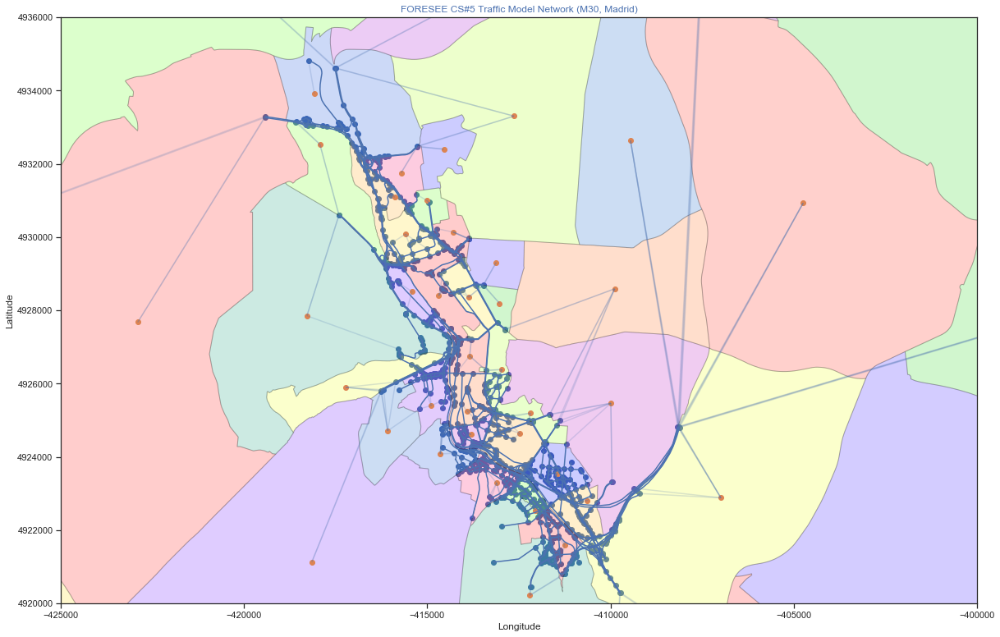

In [29]:
#Displaying the Traffic Model geodataframes ZOOM at Network Level
f, ax = plt.subplots(1, figsize=(20, 20))
ax.set_title('FORESEE CS#5 Traffic Model Network (M30, Madrid)'.format('default'), color='C0')
ax.set_xlim(-425000,-400000)#(-3.775, -3.675)#(-3.8, -3.6)
ax.set_ylim(4920000,4936000)#(40.37, 40.48)#(40.35, 40.5)
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')
gdf_TM_network_link_3857.plot(ax=ax)#, column='Tipo', cmap="Pastel1", legend=True)#color='C1')
gdf_TM_network_node_3857.plot(ax=ax)

gdf_TM_network_zone_3857.plot(ax=ax, alpha=0.2,edgecolor='k', column='NO', cmap="prism")
gdf_TM_network_zone_centroid_3857.plot(ax=ax)

gdf_TM_network_connector_3857.plot(ax=ax, alpha=0.2)

#gdf_TM_network_area.plot(ax=ax, alpha=0.4)
#gdf_TM_network_area_centroid.plot(ax=ax)

ctx.add_basemap(ax, zoom=12)
#ctx.add_basemap(ax, url=ctx.providers.Stamen.TonerLite)

plt.show()

Displaying the Traffic Model geodataframes ZOOM at **Tunnel level**

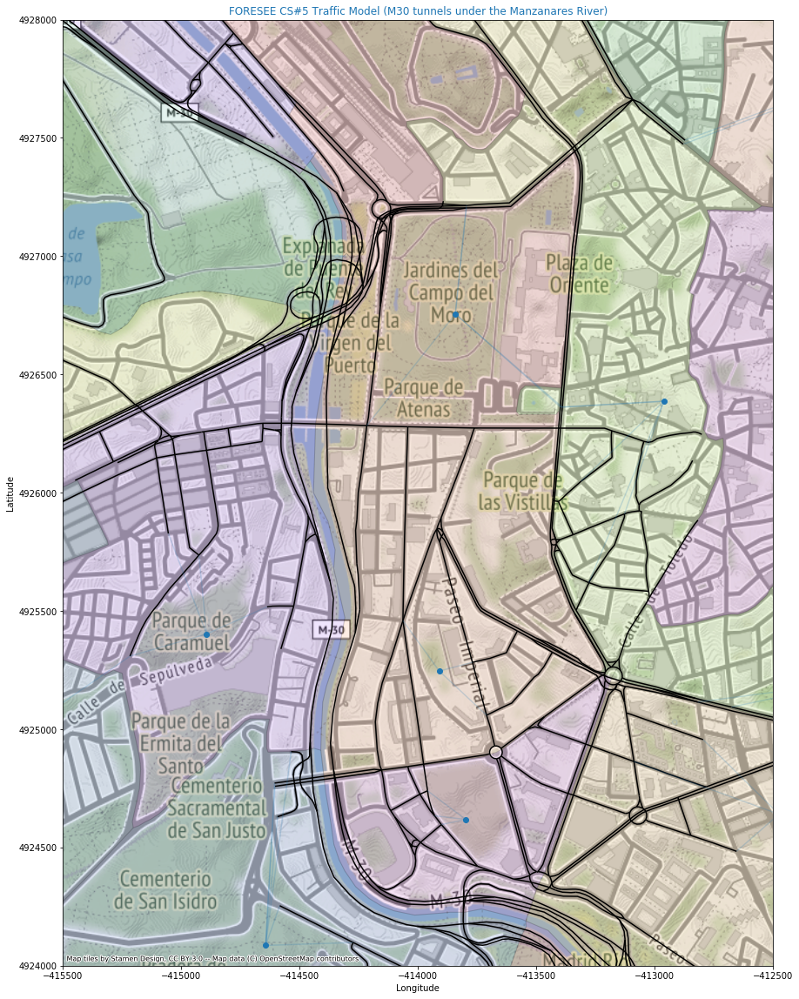

In [32]:
#Displaying the Traffic Model geodataframes ZOOM 2
f, ax = plt.subplots(1, figsize=(20, 20))
ax.set_title('FORESEE CS#5 Traffic Model (M30 tunnels under the Manzanares River)'.format('default'), color='C0')
ax.set_xlim(-415500,-412500)#(-3.775, -3.675)#(-3.8, -3.6)
ax.set_ylim(4924000,4928000)#(40.37, 40.48)#(40.35, 40.5)
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')
gdf_TM_network_link_3857.plot(ax=ax, edgecolor='black')#, column='Tipo', cmap="Pastel1", legend=True)#color='C1')
#gdf_TM_network_node_3857.plot(ax=ax)

gdf_TM_network_zone_3857.plot(ax=ax, alpha=0.1,edgecolor='k', column='NO', cmap="prism")
gdf_TM_network_zone_centroid_3857.plot(ax=ax)

gdf_TM_network_connector_3857.plot(ax=ax, alpha=0.2)

#gdf_TM_network_area.plot(ax=ax, alpha=0.4)
#gdf_TM_network_area_centroid.plot(ax=ax)

ctx.add_basemap(ax, zoom=15)
#ctx.add_basemap(ax, url=ctx.providers.Stamen.TonerLite)

plt.show()

In [33]:
gdf_TM_network_link_3857.head()

,NO,FROMNODENO,TONODENO,TYPENO,TSYSSET,LENGTH,NUMLANES,CAPPRT,V0PRT,VOLVEHPR~1,...,R_OSM_E~14,R_OSM_G~15,R_OSM_L~16,R_OSM_M~17,R_OSM_O~18,R_OSM_S~19,R_OSM_V~20,R_OSM_W~21,R_OSM_W~22,geometry
0,4,7,79,31,"BUS,CAR,HGV",0.200km,3,2600,100km/h,198,...,0,None,0,50,None,None,None,0,4318630,"LINESTRING (-410993.029 4921335.775, -411115.2..."
1,5,8,79,31,None,0.242km,3,2600,100km/h,0,...,0,None,0,50,None,None,None,1,4318630,"LINESTRING (-411259.027 4920819.906, -411115.2..."
2,15,13,1683,31,"BUS,CAR,HGV",0.031km,3,2600,100km/h,1186,...,0,None,0,100,None,None,None,0,4336707,"LINESTRING (-411007.735 4922723.152, -411021.0..."
3,16,14,1683,31,None,0.208km,3,2600,100km/h,0,...,0,None,0,100,None,None,None,1,4336707,"LINESTRING (-411262.901 4922905.700, -411062.8..."
4,17,13,15,30,"BUS,CAR,HGV",0.012km,1,1300,100km/h,0,...,0,None,0,100,None,None,None,0,4336788,"LINESTRING (-411007.735 4922723.152, -410993.6..."


In [34]:
#Identify the Tunnels
#gdf_TM_network_link_3857.head()
gdf_tunnels = gdf_TM_network_link_3857[gdf_TM_network_link_3857["R_OSM_S~19"] == "Tunnel"]
gdf_tunnels_FORESEE_NB = gdf_TM_network_link_3857[gdf_TM_network_link_3857["NO"].isin(["12198","8481","11275"])]
gdf_tunnels_FORESEE_SB = gdf_TM_network_link_3857[gdf_TM_network_link_3857["NO"].isin(["11261","8609","8610","12281","4586","11953"])]
#surrounding= world[world["name"].isin(["Portugal", "France"])] 

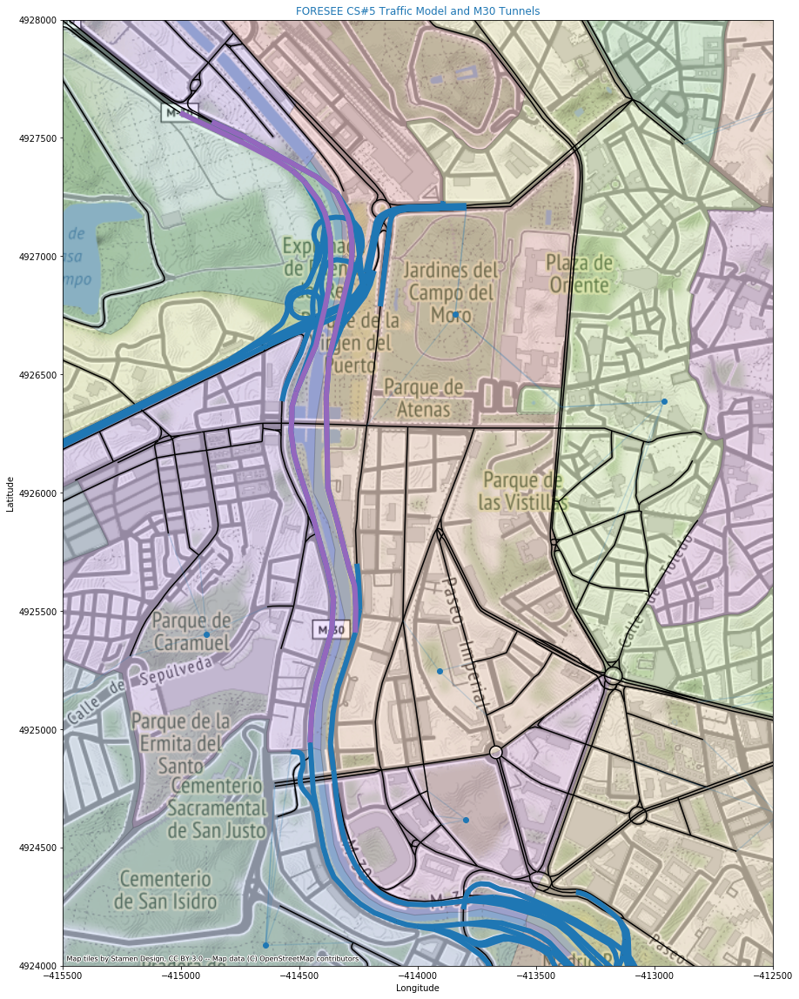

In [35]:
#Displaying the Traffic Model geodataframes ZOOM and Tunnels
f, ax = plt.subplots(1, figsize=(20, 20))
ax.set_title('FORESEE CS#5 Traffic Model and M30 Tunnels'.format('default'), color='C0')
ax.set_xlim(-415500,-412500)#(-3.775, -3.675)#(-3.8, -3.6)
ax.set_ylim(4924000,4928000)#(40.37, 40.48)#(40.35, 40.5)
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')
gdf_TM_network_link_3857.plot(ax=ax, edgecolor='black')#, column='Tipo', cmap="Pastel1", legend=True)#color='C1')
gdf_tunnels.plot(ax=ax, linewidth=6)#, linestyle=(0, (5, 2, 1, 2)))
gdf_tunnels_FORESEE_NB.plot(ax=ax, linewidth=6, color='C4')
gdf_tunnels_FORESEE_SB.plot(ax=ax, linewidth=6, color='C4')
#gdf_TM_network_node_3857.plot(ax=ax)

gdf_TM_network_zone_3857.plot(ax=ax, alpha=0.1,edgecolor='k', column='NO', cmap="prism")
gdf_TM_network_zone_centroid_3857.plot(ax=ax)

gdf_TM_network_connector_3857.plot(ax=ax, alpha=0.2)

#gdf_TM_network_area.plot(ax=ax, alpha=0.4)
#gdf_TM_network_area_centroid.plot(ax=ax)

ctx.add_basemap(ax, zoom=15)
#ctx.add_basemap(ax, url=ctx.providers.Stamen.TonerLite)

plt.show()

## DATA EXPLORATION FOR A RAMDOM EXAMPLE TRAFFIC DISRUPTIVE  EVENT DAY

By exploring the news we learnt that there was an event affecting the mention area the 2015-04-19. This date will serve as a data exploration excuse to see the effects this disruptive event had on traffic.
The date 2015-04-19 was a Sunday with no other foreseen effects, therefore it seems reasonable to be able to compare it to another Sunday if necesary (26th).

**EVENT: 2015-04-19**
    A broken pipe floods the M-30 tunnels near the Calderón
The bridge in Segovia will remain closed this Sunday and Monday while the damage is being repaired
...the flooding has been caused by the breakage of a waterway that crosses the Paseo Virgen del Puerto. The flooding has affected part of the M-30 and has forced the restriction of traffic on this road from the area of the Vicente Calderón stadium in the direction of the A-5 and A-6 for a few hours.

Source: https://www.abc.es/espana/20150419/rc-rotura-tuberia-inunda-puente-201504191751.html

In [36]:
#Exploring the Traffic data from 2015-04
raw_data_source_2015_04 = ".\\data_subset\\04-2015.csv"
df_M = pd.read_csv(raw_data_source_2015_04,sep =';')

In [37]:
print ("df_M",df_M.columns)
print(df_M.info())
df_M.head

df_M Index(['idelem', 'fecha', 'identif', 'tipo_elem', 'intensidad', 'ocupacion',
       'carga', 'vmed', 'error', 'periodo_integracion'],
      dtype='object')
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10267756 entries, 0 to 10267755
Data columns (total 10 columns):
idelem                 int64
fecha                  object
identif                object
tipo_elem              object
intensidad             int64
ocupacion              int64
carga                  int64
vmed                   int64
error                  object
periodo_integracion    int64
dtypes: int64(6), object(4)
memory usage: 783.4+ MB
None


<bound method NDFrame.head of           idelem                fecha identif              tipo_elem  \
0           4155  2015-04-10 12:30:00   13001  PUNTOS MEDIDA URBANOS   
1           4155  2015-04-13 13:45:00   13001  PUNTOS MEDIDA URBANOS   
2           4155  2015-04-13 14:00:00   13001  PUNTOS MEDIDA URBANOS   
3           4155  2015-04-24 10:15:00   13001  PUNTOS MEDIDA URBANOS   
4           4155  2015-04-24 11:30:00   13001  PUNTOS MEDIDA URBANOS   
...          ...                  ...     ...                    ...   
10267751    7064  2015-04-30 12:30:00   17306  PUNTOS MEDIDA URBANOS   
10267752    7064  2015-04-30 12:45:00   17306  PUNTOS MEDIDA URBANOS   
10267753    7064  2015-04-30 13:00:00   17306  PUNTOS MEDIDA URBANOS   
10267754    7063  2015-04-30 12:45:00   17307  PUNTOS MEDIDA URBANOS   
10267755    7063  2015-04-30 13:00:00   17307  PUNTOS MEDIDA URBANOS   

          intensidad  ocupacion  carga  vmed error  periodo_integracion  
0               1634         10

In [38]:
# Loading Traffic Counting Points for the Traffic Model
gdf_TM_TCP = gpd.read_file('./data_subset/Network_CS_countlocation.shp')
print ("gdf_TM_TCP",gdf_TM_TCP.columns)
print(gdf_TM_TCP.info())
gdf_TM_TCP['CODE'].head

gdf_TM_TCP Index(['NO', 'CODE', 'NAME', 'FROMNODENO', 'TONODENO', 'XCOORD', 'LINKNO',
       'YCOORD', 'N_COD_CENT', 'N_T_ELEM', 'geometry'],
      dtype='object')
<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 309 entries, 0 to 308
Data columns (total 11 columns):
NO            309 non-null int64
CODE          309 non-null object
NAME          309 non-null object
FROMNODENO    309 non-null int64
TONODENO      309 non-null int64
XCOORD        309 non-null float64
LINKNO        309 non-null int64
YCOORD        309 non-null float64
N_COD_CENT    309 non-null object
N_T_ELEM      309 non-null object
geometry      309 non-null geometry
dtypes: float64(2), geometry(1), int64(4), object(4)
memory usage: 26.7+ KB
None


<bound method NDFrame.head of 0      3531
1      6765
2      6688
3      6687
4      4798
       ... 
304    6782
305    3496
306    3836
307    6694
308    6813
Name: CODE, Length: 309, dtype: object>

In [39]:
#How many records and TCP in the RAW data?
#df_M.idelem.unique()
print("From ", len(df_M['idelem'].tolist()), "records, there are : ", len(df_M['idelem'].unique().tolist()), " unique TCP")

From  10267756 records, there are :  3755  unique TCP


In [40]:
#How many TCP irequired for Traffi Model
#gdf_TM_TCP.CODE.unique()
print("TCP for the Traffic Model: ", len(gdf_TM_TCP['CODE'].tolist()))

TCP for the Traffic Model:  309


In [41]:
#Filter RAW data by the TCP for the Traffic Model
df_M_F = df_M[(df_M['idelem'].isin(gdf_TM_TCP['CODE'].tolist()))].copy()
print(df_M_F.info())
#df_M_F['idelem'].head   
df_M_F.head  

<class 'pandas.core.frame.DataFrame'>
Int64Index: 799439 entries, 15 to 10263593
Data columns (total 10 columns):
idelem                 799439 non-null int64
fecha                  799439 non-null object
identif                799439 non-null object
tipo_elem              799439 non-null object
intensidad             799439 non-null int64
ocupacion              799439 non-null int64
carga                  799439 non-null int64
vmed                   799439 non-null int64
error                  799439 non-null object
periodo_integracion    799439 non-null int64
dtypes: int64(6), object(4)
memory usage: 67.1+ MB
None


<bound method NDFrame.head of           idelem                fecha identif              tipo_elem  \
15          4329  2015-04-07 22:00:00   16060  PUNTOS MEDIDA URBANOS   
240         4078  2015-04-10 19:30:00   11001  PUNTOS MEDIDA URBANOS   
241         4079  2015-04-10 19:30:00   11002  PUNTOS MEDIDA URBANOS   
242         4083  2015-04-10 19:30:00   11007  PUNTOS MEDIDA URBANOS   
243         3728  2015-04-10 19:30:00   11008  PUNTOS MEDIDA URBANOS   
...          ...                  ...     ...                    ...   
10263589    5103  2015-04-13 13:15:00   13059  PUNTOS MEDIDA URBANOS   
10263590    5103  2015-04-13 13:45:00   13059  PUNTOS MEDIDA URBANOS   
10263591    5103  2015-04-13 14:00:00   13059  PUNTOS MEDIDA URBANOS   
10263592    5103  2015-04-24 11:30:00   13059  PUNTOS MEDIDA URBANOS   
10263593    5103  2015-04-30 12:45:00   13059  PUNTOS MEDIDA URBANOS   

          intensidad  ocupacion  carga  vmed error  periodo_integracion  
15               588          1

In [42]:
#ADD auxiliary columns to the dataframe to ease the processing
#disagregating the date info
df_M_F['M_year'] = pd.DatetimeIndex(df_M_F['fecha']).year
df_M_F['M_month'] = pd.DatetimeIndex(df_M_F['fecha']).month
df_M_F['M_day'] = pd.DatetimeIndex(df_M_F['fecha']).day
df_M_F['M_hour'] = pd.DatetimeIndex(df_M_F['fecha']).hour
df_M_F['M_minute'] = pd.DatetimeIndex(df_M_F['fecha']).minute


In [43]:
#Explore the event day
df_M_F_event = df_M_F[(df_M_F['M_day'] == 19)]
print(df_M_F_event.info())
df_M_F_event.head 
#Save for tests
#df_M_F_event.to_csv('2015-04-19_TCP.csv', index=False, sep=';',decimal=',')#header=False

<class 'pandas.core.frame.DataFrame'>
Int64Index: 26756 entries, 4757606 to 8634307
Data columns (total 15 columns):
idelem                 26756 non-null int64
fecha                  26756 non-null object
identif                26756 non-null object
tipo_elem              26756 non-null object
intensidad             26756 non-null int64
ocupacion              26756 non-null int64
carga                  26756 non-null int64
vmed                   26756 non-null int64
error                  26756 non-null object
periodo_integracion    26756 non-null int64
M_year                 26756 non-null int64
M_month                26756 non-null int64
M_day                  26756 non-null int64
M_hour                 26756 non-null int64
M_minute               26756 non-null int64
dtypes: int64(11), object(4)
memory usage: 3.3+ MB
None


<bound method NDFrame.head of          idelem                fecha  identif              tipo_elem  \
4757606    4096  2015-04-19 00:00:00    11025  PUNTOS MEDIDA URBANOS   
4757608    4100  2015-04-19 00:00:00    11029  PUNTOS MEDIDA URBANOS   
4771252    4182  2015-04-19 00:00:00    13040  PUNTOS MEDIDA URBANOS   
4771253    4184  2015-04-19 00:00:00    13042  PUNTOS MEDIDA URBANOS   
4777391    4230  2015-04-19 00:00:00    14031  PUNTOS MEDIDA URBANOS   
...         ...                  ...      ...                    ...   
8634179    6694  2015-04-19 23:45:00  PM12331     PUNTOS MEDIDA M-30   
8634282    6781  2015-04-19 23:45:00  PM32051     PUNTOS MEDIDA M-30   
8634283    6782  2015-04-19 23:45:00  PM32351     PUNTOS MEDIDA M-30   
8634284    3496  2015-04-19 23:45:00  PM32352     PUNTOS MEDIDA M-30   
8634307    3705  2015-04-19 23:45:00  PM41451     PUNTOS MEDIDA M-30   

         intensidad  ocupacion  carga  vmed error  periodo_integracion  \
4757606          66          0 

In [44]:
Table_df_M_F_event = pd.pivot_table(df_M_F_event, values='intensidad', 
                        index=['idelem', 'M_hour'], 
                        aggfunc=np.mean)

In [45]:
print(Table_df_M_F_event.info())
Table_df_M_F_event.head()

<class 'pandas.core.frame.DataFrame'>
MultiIndex: 6753 entries, (1009, 0) to (9961, 10)
Data columns (total 1 columns):
intensidad    6753 non-null float64
dtypes: float64(1)
memory usage: 75.1 KB
None


intensidad
idelem M_hour            
1009   0           1038.0
       1           1077.0
       2            678.0
       3            495.0
       4            318.0

In [46]:
#Save the usefull table for the event date
Table_df_M_F_event.to_csv('2015-04-19_TCP_table.csv', sep=';',decimal=',')#, index=False, header=False

## DATA EXPLORATION FOR A SECOND RAMDOM EXAMPLE TRAFFIC DISRUPTIVE  EVENT DAY (2019)

**EVENT: 2019-08-26**
   On Monday, a huge storm caused severe flooding in several towns in the Community of Madrid, with traffic cuts on the M-40 and M-30

Source: https://www.elmundo.es/madrid/2019/08/26/5d64139bfdddff923e8b4578.html

In [48]:
#ANALYSIS OF ANOTHER EVENT: 2019-08-26
#Exploring the Traffic data from 2019-08-26
raw_data_source_2019_08 = ".\\data_subset\\08-2019.csv"
df_M = pd.read_csv(raw_data_source_2019_08,sep =';')
print("From ", len(df_M['id'].tolist()), "records, there are : ", len(df_M['id'].unique().tolist()), " unique TCP")
print("TCP for the Traffic Model: ", len(gdf_TM_TCP['CODE'].tolist()))
#Filter RAW data by the TCP for the Traffic Model
df_M_F = df_M[(df_M['id'].isin(gdf_TM_TCP['CODE'].tolist()))].copy()
#ADD auxiliary columns to the dataframe to ease the processing
#disagregating the date info
df_M_F['M_year'] = pd.DatetimeIndex(df_M_F['fecha']).year
df_M_F['M_month'] = pd.DatetimeIndex(df_M_F['fecha']).month
df_M_F['M_day'] = pd.DatetimeIndex(df_M_F['fecha']).day
df_M_F['M_hour'] = pd.DatetimeIndex(df_M_F['fecha']).hour
df_M_F['M_minute'] = pd.DatetimeIndex(df_M_F['fecha']).minute


From  11283290 records, there are :  3998  unique TCP
TCP for the Traffic Model:  309


In [49]:
#Explore the event day
#--------------------------------
df_M_F_event = df_M_F[(df_M_F['M_day'] == 26)]
Table_df_M_F_event = pd.pivot_table(df_M_F_event, 
                                    values=['intensidad','ocupacion','carga','vmed','error','periodo_integracion'], 
                                    index=['id', 'M_hour'], 
                                    aggfunc=np.mean)
#print(Table_df_M_F_event.info())
#Table_df_M_F_event.head()						
#Save the usefull table for the event date
Table_df_M_F_event.to_csv('2019-08-26_TCP_table_coma.csv', sep=';',decimal=',')#, index=False, header=False
Table_df_M_F_event.to_csv('2019-08-26_TCP_table.csv', sep=';',decimal='.')#, index=False, header=False

#Explore the days near the event
#-------------------------------- DAY BEFORE
df_M_F_event = df_M_F[(df_M_F['M_day'] == 25)]
Table_df_M_F_event = pd.pivot_table(df_M_F_event, 
                                    values=['intensidad','ocupacion','carga','vmed','error','periodo_integracion'], 
                                    index=['id', 'M_hour'], 
                                    aggfunc=np.mean)
#print(Table_df_M_F_event.info())
#Table_df_M_F_event.head()						
#Save the usefull table for the event date
Table_df_M_F_event.to_csv('2019-08-25_TCP_table_coma.csv', sep=';',decimal=',')#, index=False, header=False
Table_df_M_F_event.to_csv('2019-08-25_TCP_table.csv', sep=';',decimal='.')#, index=False, header=False
#-------------------------------- DAY AFTERWARDS
df_M_F_event = df_M_F[(df_M_F['M_day'] == 27)]
Table_df_M_F_event = pd.pivot_table(df_M_F_event, 
                                    values=['intensidad','ocupacion','carga','vmed','error','periodo_integracion'], 
                                    index=['id', 'M_hour'], 
                                    aggfunc=np.mean)
#print(Table_df_M_F_event.info())
#Table_df_M_F_event.head()						
#Save the usefull table for the event date
Table_df_M_F_event.to_csv('2019-08-27_TCP_table_coma.csv', sep=';',decimal=',')#, index=False, header=False
Table_df_M_F_event.to_csv('2019-08-27_TCP_table.csv', sep=';',decimal='.')#, index=False, header=False
#-------------------------------- SAME DAY BUT WEEK BEFORE
df_M_F_event = df_M_F[(df_M_F['M_day'] == 19)]
Table_df_M_F_event = pd.pivot_table(df_M_F_event, 
                                    values=['intensidad','ocupacion','carga','vmed','error','periodo_integracion'], 
                                    index=['id', 'M_hour'], 
                                    aggfunc=np.mean)
#print(Table_df_M_F_event.info())
#Table_df_M_F_event.head()						
#Save the usefull table for the event date
Table_df_M_F_event.to_csv('2019-08-19_TCP_table_coma.csv', sep=';',decimal=',')#, index=False, header=False
Table_df_M_F_event.to_csv('2019-08-19_TCP_table.csv', sep=';',decimal='.')#, index=False, header=False

The cause root of this incident is related to the storm called DANA. It affected not only the M30 tunnels, but also many other alternative routes and transport netowrks such as the subway and urban roads. The resulting traffic is quite caotic, intermitent and with different affections being much greater than the scope of the current Transport Network. Need to investigate further.

Detected the source of the incident reports data sets. Investigating if the analisis of this reports can yield better disaster examples to be able to focus the Traffic Simulation to this context.

# INCIDENTS. Data preprocessing

#### Historical data of incidents and accidents (Tráfico Calle 30. Histórico de incidencias y accidentes  )

The open data service of the city of Madrid has made available the historical data of traffic accidents for Madrid city and M-30 for the last 3 years. The information includes the coded location, the causes and consequences of the accidents from 2016 to 2018 (2019 data is currently under consolidation and not available).

The general link is:

- Tráfico Calle 30. Histórico de incidencias y accidentes:
    - https://datos.madrid.es/portal/site/egob/menuitem.c05c1f754a33a9fbe4b2e4b284f1a5a0/?vgnextoid=6e1ce0f3e8e22610VgnVCM1000001d4a900aRCRD&vgnextchannel=374512b9ace9f310VgnVCM100000171f5a0aRCRD&vgnextfmt=default


In [51]:
#Downloading the incident data into dataframes
#url2019 = ''#Not avaialble yet
url2018 = 'https://datos.madrid.es/egob/catalogo/300201-4-calle30-accidentes-historico.csv'
url2017 = 'https://datos.madrid.es/egob/catalogo/300201-0-calle30-accidentes-historico.csv'
url2016 = 'https://datos.madrid.es/egob/catalogo/300201-2-calle30-accidentes-historico.csv'
#df2019 = pd.read_csv(url2018)
df2018 = pd.read_csv(url2018, sep=';',encoding ='iso-8859-1')#UnicodeDecodeError: 'utf-8' codec
df2017 = pd.read_csv(url2017, sep=';',encoding ='iso-8859-1')
df2016 = pd.read_csv(url2016, sep=';',encoding ='iso-8859-1')

The raw data includes the fields and description showed in the next format:

The **INCIDENT REPORT** information files contain data about the :

 * ``Fecha ``: Date of incident
 * ``Hora `` : Time of incidence
 * ``Día  `` : Weekday
 * ``Nº Incidencia `` : No. Code (year-day-number) 
 * ``sitrem `` : N/A
 * ``Carretera `` :  Road
 * ``MC30 `` : MC30 Internal code identifying the location of the M-30 tunnel where the incident occurred. Each section of the tunnel has a code formed by 4 numbers and 2 letters: The numbers of the code indicate the kilometer point of the track and the letters, the roadway/lane in which it is (X: exterior, N: interior, C: central, L: lateral, E: ambassadors, S: exit, T: entrance, F: fairs, R: branches). For example: NC stands for Interior Central Roadway, XL is Outer Lateral Roadway, etc.  The rest of the letters that appear do not provide data of interest at the user level.
 * ``Calzada (ENTRADA / EXTERIOR / INTERIOR / SALIDA)  `` : Roadway (ENTRY / EXTERIOR / INTERIOR / EXIT)
 * ``Localización (Ramal / Tronco / VS) `` : Location (Branch / Trunk / VS)
 * ``Enlace (Túnel / Superficie) `` : Tunnel / Surface link
 * ``Tipo de accidente (Atropello/Colisión de vehículos/Colisión de obstáculos/Salida vía/Otros) `` : Type of accident (Running over / Vehicle collision / Obstacle collision / Track exit / Other)
 * ``Tipo de colisión (Frontal / Lateral / Por alcance / Contra mediana) `` : Type of collision (Front / Side / Reach / Against-median)
 * ``Nº Vehículos implicados `` : Number of vehicles involved 
 * ``Nº Turismos `` :  No. of cars
 * ``Nº Motocicletas `` : No. of motorcycles
 * ``Nº vehículos pesados  `` : Number of heavy vehicles
 * ``HL `` : Mildly injured
 * ``HG `` : Serious Injury
 * ``VM  `` : Death Victim
 * ``Daños al mobiliario  urbano (SI / NO) `` : Damage to street furniture (YES / NO)
 * ``Circulación (Fluida / Densa / Congestionada) `` : Traffic flow cahraterization (Fluid / Dense / Congested)
 * ``Estado del Firme (Aceite / Mojado / Seco y limpio) `` : Road firm asphalt condition (Oil / Wet / Dry & Clean)
 * ``Presencia Recursos  Externos (Policía Municipal / Policía Nacional / SAMUR / Bomberos / Guardia Civil) `` : Presence External Resources (Municipal Police / National Police / ER SAMUR / Fire Department / Guardia Civil)
 * ``Corte Carril `` : Lane Cutting  
 * ``Vertido `` : Discharge  
 * ``Grúa usuario `` : User Tow truck  
 * ``Grúa Propia EMESA `` : EMESA Tow truck  
 * ``Grúa externa `` : External  Tow truck 
 * ``Grúa movilidad `` : Municipal  Tow truck  
 * ``Factores Atmosféricos (Buen tiempo / Lluvia / Niebla / Nieve / Viento / Otros) `` : Atmospheric Factors (Good weather / Rain / Fog / Snow / Wind / Other)
 * ``Visibilidad señalización `` : Signal visibility 	
 * ``Señalización de Peligro `` : Danger Signs 
 * ``Visibilidad restringida por `` : Visibility restricted by 
 * ``Nº Vehículos implicados `` : No. of vehicles involved 	
 * ``Nº Motocicletas `` : No. of motorcycles 	
 * ``Nº vehículos pesados viario `` :  No. of heavy road vehicles 	
 * ``Árboles `` : Trees 
 * ``Vehículos denominación `` : Vehicles ID
 * ``Descripción del accidente `` : Description of the accident 
 * ``Daños causados al viario `` : Damage caused to the infrastructure 
 * ``Materiales utilizados `` : Materials used 
 * ``Observaciones `` : Observations

(NOTE some fields change through time)

Analyzing the fields included in the incident data, we see that the report is biased towards accident incidents. Even though most incidents are most likely accidents between vechicles, it is considered a very interesting source of data that can be corelated with the disruptive events under study.

From the given fields we have identified that the column called MC30 indicates the location of the event. For example, code 14XL89 refers to:
   - __14XL89__: Km point (KP) 1489 and lateral (L) outer (X) roadway

The events located between km points 12.00 and 18.90 are within our study area. Therefore the M30 codes between "12NL00" to "14XL89" will be of our interest.

In [52]:
#Read incicent file example --- Listado_accidentes_2018
df2018.head()

,Fecha,Hora,Día,Nº Incidencia,SITREM,Carretera,MC30,CALZADA,Localización,Enlace,...,Visibilidad señalización,Señalización de Peligro,Visibilidad restringida por,Aceras,Árboles,Vehículos denominación,Descripción del accidente,Daños causados al viario,Materiales utilizados,Observaciones
0,01/01/2018,18:49,lunes,20180101-0015,C-E-ACC-01,M30,04NC70,INTERIOR,Tronco,Superficie,...,Sin restricciones,NaN,Sin Restricción,NaN,NaN,V-1 / V-2,Vehiculo 1 se sale de via colisionando contra ...,1 mt2 pared forjado paso inferior,NaN,NaN
1,02/01/2018,15:22,martes,20180102-0018,C-P-ACC-01,M30,10NL00,INTERIOR,VS,Superficie,...,Sin restricciones,NaN,Sin Restricción,NaN,NaN,V1,Colisión de 2 vehículos en carril derecho.,NaN,NaN,Corte carril derecho 15:22 - 16:22
2,03/01/2018,12:39,miércoles,20180103-0009,C-E-ACC-01,A2,04AT20,ENTRADA,Tronco,Superficie,...,Sin restricciones,NaN,Sin Restricción,NaN,NaN,V4,Colisión de vehículos por alcance en ncarril d...,2 Barreras - 2 CPN - 2 Sujección barrera - 1 H...,NaN,Corte carril 12:45 - 14:04.
3,03/01/2018,17:54,miércoles,20180103-0019,C-P-ACC-01,M30,11XL60,EXTERIOR,VS,Superficie,...,Sin restricciones,NaN,Sin Restricción,NaN,NaN,V4,Accidente por colisión.Sin heridos.Vehículos s...,NaN,NaN,Corte carril 17:54 - 18:33.
4,03/01/2018,18:43,miércoles,20180103-0021,C-P-ACC-01,M30,11XL40,EXTERIOR,VS,Superficie,...,Sin restricciones,NaN,Sin Restricción,NaN,NaN,V1,Colisión de 2 vehículos en carril central.Limp...,NaN,Desengrasante,Corte carril central 19:04 - 19:29.


In [70]:
# sorting both the lists 
df2018.columns.tolist().sort() 
df2016.columns.tolist().sort() 
  
# using == to check if columns lists are equal 
if df2018.columns.tolist().sort() == df2016.columns.tolist().sort(): 
    print ("The columns are identical") 
else : 
    print ("The columns are not identical") 

The columns are identical


In [73]:
#Concatenate all incident report into one dataframe
frames = [df2016, df2017, df2018]
df_Incidents=pd.concat(frames, sort=False)

In [75]:
df_Incidents.tail()

,Fecha,Hora,Día,Nº Incidencia,sitrem,Carretera,MC30,Calzada,Localización,Enlace,...,Día,HL,HG,VM,Grúa externa,SITREM,CALZADA,Nº vehículos pesados,H.G.,V.M.
2227,30/12/2018,19:30,domingo,20181230-0016,NaN,M30,04XL80,NaN,VS,Superficie,...,NaN,NaN,NaN,NaN,No,C-P-ACC-01,Exterior,NaN,0.0,0.0
2228,31/12/2018,1:49,lunes,20181231-0001,NaN,M30,07RN58,NaN,Ramal,Superficie,...,NaN,NaN,NaN,NaN,No,C-P-ACC-01,Interior,NaN,0.0,0.0
2229,31/12/2018,9:31,lunes,20181231-0004,NaN,M30,07XL80,NaN,VS,Superficie,...,NaN,NaN,NaN,NaN,No,C-P-ACC-01,Exterior,NaN,0.0,0.0
2230,31/12/2018,20:55,lunes,20181231-0012,NaN,M30,10NL70,NaN,VS,Superficie,...,NaN,NaN,NaN,NaN,No,C-P-ACC-01,Interior,NaN,0.0,0.0
2231,31/12/2018,22:04,lunes,20181231-0013,NaN,M30,11XC40,NaN,Tronco,Superficie,...,NaN,NaN,NaN,NaN,No,C-P-ACC-01,Exterior,NaN,0.0,0.0


In [118]:
print(df_Incidents['MC30'][2231])
print(int(''.join(filter(str.isdigit, df_Incidents['MC30'][2231]))))
print(df_Incidents['MC30'][2231][2:4])
print(df_Incidents['MC30'][2231][:5])

11XC40
1140
XC
11XC4


In [120]:
#ADD auxiliary columns to the dataframe to ease the processing
df_Incidents['MC30_A'] = df_Incidents['MC30'].str.slice(0,5)

In [134]:
df_Incidents.tail()

,Fecha,Hora,Día,Nº Incidencia,sitrem,Carretera,MC30,Calzada,Localización,Enlace,...,HL,HG,VM,Grúa externa,SITREM,CALZADA,Nº vehículos pesados,H.G.,V.M.,MC30_A
2227,30/12/2018,19:30,domingo,20181230-0016,NaN,M30,04XL80,NaN,VS,Superficie,...,NaN,NaN,NaN,No,C-P-ACC-01,Exterior,NaN,0.0,0.0,04XL8
2228,31/12/2018,1:49,lunes,20181231-0001,NaN,M30,07RN58,NaN,Ramal,Superficie,...,NaN,NaN,NaN,No,C-P-ACC-01,Interior,NaN,0.0,0.0,07RN5
2229,31/12/2018,9:31,lunes,20181231-0004,NaN,M30,07XL80,NaN,VS,Superficie,...,NaN,NaN,NaN,No,C-P-ACC-01,Exterior,NaN,0.0,0.0,07XL8
2230,31/12/2018,20:55,lunes,20181231-0012,NaN,M30,10NL70,NaN,VS,Superficie,...,NaN,NaN,NaN,No,C-P-ACC-01,Interior,NaN,0.0,0.0,10NL7
2231,31/12/2018,22:04,lunes,20181231-0013,NaN,M30,11XC40,NaN,Tronco,Superficie,...,NaN,NaN,NaN,No,C-P-ACC-01,Exterior,NaN,0.0,0.0,11XC4


The MC30 localization codes are not evident, and the source does not provide a shapefile for them. Therefore we converted one showing the possible places every 10m to be able to track the places better. Please note that the incidents might be reported to happen in between. The points are only references to visually help find the incident MC30 code.

In [122]:
# Loading Incident Localization MC30 helping shapefile geadataframe
gdf_I_MC30 = gpd.read_file('./data_subset/Tunel_M30_Puntos_Kilometricos.shp')
#Converting the data to Web Mercator coordinate system
gdf_I_MC30_3857 = gdf_I_MC30.to_crs(epsg=3857)

In [123]:
gdf_I_MC30_3857.head()

,Name,descriptio,timestamp,begin,end,altitudeMo,tessellate,extrude,visibility,drawOrder,icon,geometry
0,13NL30,NL,None,None,None,None,-1,0,-1,None,None,POINT (-411397.208 4922393.228)
1,13NL40,NL,None,None,None,None,-1,0,-1,None,None,POINT (-411485.262 4922493.925)
2,13NL50,NL,None,None,None,None,-1,0,-1,None,None,POINT (-411570.755 4922592.432)
3,13NL60,NL,None,None,None,None,-1,0,-1,None,None,POINT (-411655.024 4922691.816)
4,13NL70,NL,None,None,None,None,-1,0,-1,None,None,POINT (-411734.840 4922795.586)


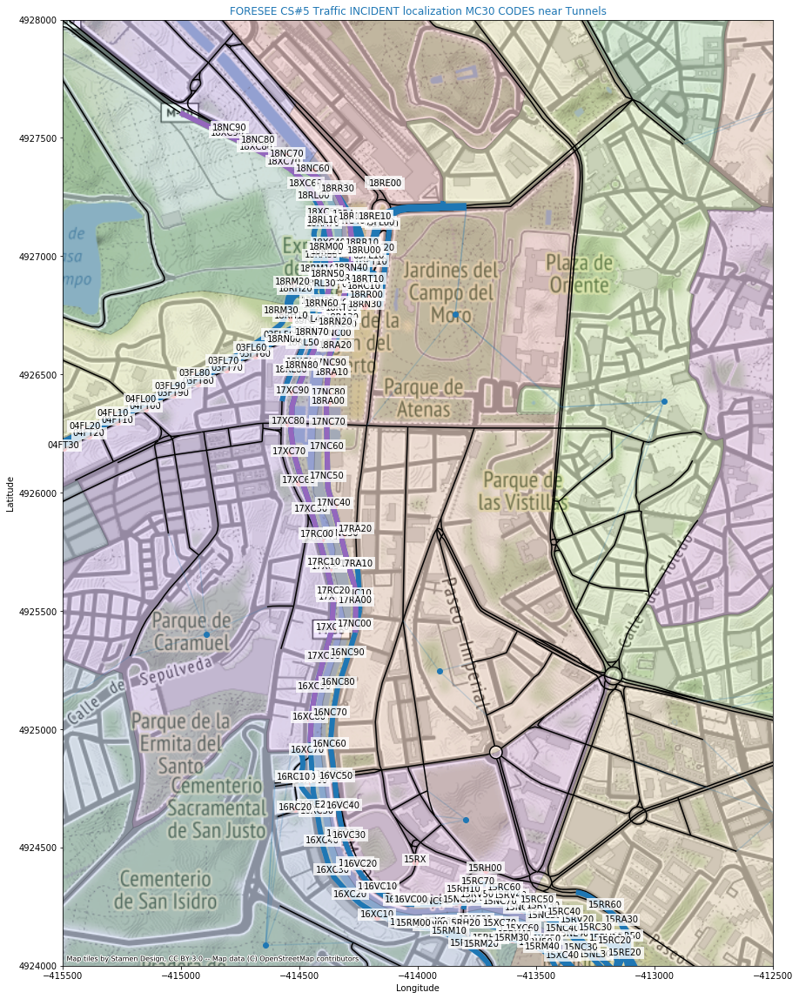

In [124]:
#Displaying the Tunnel CODES geodataframes
f, ax = plt.subplots(1, figsize=(20, 20))
ax.set_title('FORESEE CS#5 Traffic INCIDENT localization MC30 CODES near Tunnels'.format('default'), color='C0')
ax.set_xlim(-415500,-412500)#(-3.775, -3.675)#(-3.8, -3.6)
ax.set_ylim(4924000,4928000)#(40.37, 40.48)#(40.35, 40.5)
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')

#polygon = Polygon([(0, 0), (0, 90), (180, 90), (180, 0), (0, 0)])
polygon = Polygon([(-415500,4928000), (-415500,4924000), (-412500,4924000), (-412500,4928000), (-415500,4928000)])
gdf_I_MC30_3857_clipped = gpd.clip(gdf_I_MC30_3857, polygon) #You need GeoPandas 0.7 to use clip
gdf_I_MC30_3857_clipped.plot(ax=ax, color='red')

#gdf_I_MC30_3857.apply(lambda x: ax.annotate(s=x['Name'], xy=x.geometry.centroid.coords[0], ha='center'),axis=1);
gdf_I_MC30_3857_clipped.apply(lambda x: ax.text(s=x['Name'],
                                                x=x.geometry.centroid.coords[0][0],
                                                y=x.geometry.centroid.coords[0][1],
                                                ha='center',
                                                bbox={'facecolor': 'white', 'alpha':0.8, 'pad': 2, 'edgecolor':'none'})
                              ,axis=1);


gdf_TM_network_link_3857.plot(ax=ax, edgecolor='black')#, column='Tipo', cmap="Pastel1", legend=True)#color='C1')
gdf_tunnels.plot(ax=ax, linewidth=6)#, linestyle=(0, (5, 2, 1, 2)))
gdf_tunnels_FORESEE_NB.plot(ax=ax, linewidth=6, color='C4')
gdf_tunnels_FORESEE_SB.plot(ax=ax, linewidth=6, color='C4')
#gdf_TM_network_node_3857.plot(ax=ax)

gdf_TM_network_zone_3857.plot(ax=ax, alpha=0.1,edgecolor='k', column='NO', cmap="prism")
gdf_TM_network_zone_centroid_3857.plot(ax=ax)

gdf_TM_network_connector_3857.plot(ax=ax, alpha=0.2)

#gdf_TM_network_area.plot(ax=ax, alpha=0.4)
#gdf_TM_network_area_centroid.plot(ax=ax)

ctx.add_basemap(ax, zoom=15)
#ctx.add_basemap(ax, url=ctx.providers.Stamen.TonerLite)

plt.show()


Taking into account the MC30 code location of the incident events, and assuming a localization is aproximate to the geometry Localization MC30 helping shapefile geadataframe points (this is a aproximation that seems to have a 10m radious). We assign the aproximate incident to the helping point in order to allow for area analysis.

In [136]:
#ADD auxiliary column to the dataframe to ease the processing
gdf_I_MC30_3857['MC30_A'] = gdf_I_MC30_3857['Name'].str.slice(0,5)
gdf_I_MC30_3857.head()

,Name,descriptio,timestamp,begin,end,altitudeMo,tessellate,extrude,visibility,drawOrder,icon,geometry,MC30_A
0,13NL30,NL,None,None,None,None,-1,0,-1,None,None,POINT (-411397.208 4922393.228),13NL3
1,13NL40,NL,None,None,None,None,-1,0,-1,None,None,POINT (-411485.262 4922493.925),13NL4
2,13NL50,NL,None,None,None,None,-1,0,-1,None,None,POINT (-411570.755 4922592.432),13NL5
3,13NL60,NL,None,None,None,None,-1,0,-1,None,None,POINT (-411655.024 4922691.816),13NL6
4,13NL70,NL,None,None,None,None,-1,0,-1,None,None,POINT (-411734.840 4922795.586),13NL7


In [213]:
#Add aproximate georeferences to INCIDENT data localizations
#gdf_Incidents = pd.merge(df_Incidents,gdf_I_MC30_3857['Name','geometry'], how='left',left_on='MC30_A', right_on='Name')
ldf_Incidents = pd.merge(df_Incidents,gdf_I_MC30_3857, on='MC30_A')
print("df_Incidents : {}".format(df_Incidents.shape))
print("gdf_I_MC30_3857 : {}".format(gdf_I_MC30_3857.shape))
print("ldf_Incidents : {}".format(gdf_Incidents.shape))
ldf_Incidents.head()

df_Incidents : (6437, 53)
gdf_I_MC30_3857 : (515, 13)
ldf_Incidents : (1082, 65)


,Fecha,Hora,Día,Nº Incidencia,sitrem,Carretera,MC30,Calzada,Localización,Enlace,...,timestamp,begin,end,altitudeMo,tessellate,extrude,visibility,drawOrder,icon,geometry
0,01/01/2016,23:21,NaN,20160101-0018,T-P-ACC-01,M30,14NL18,INTERIOR,Tronco,Túnel,...,None,None,None,None,-1,0,-1,None,None,POINT (-412035.959 4923223.393)
1,21/03/2016,06:16,NaN,20160321-0004,T-E-ACC-01,M30,14NL19,INTERIOR,Tronco,Túnel,...,None,None,None,None,-1,0,-1,None,None,POINT (-412035.959 4923223.393)
2,30/03/2016,17:25,NaN,20160330-0027,T-E-ACC-01,M30,14NL18,INTERIOR,Tronco,Túnel,...,None,None,None,None,-1,0,-1,None,None,POINT (-412035.959 4923223.393)
3,25/05/2016,18:29,NaN,20160525-0019,T-P-ACC-01,M30,14NL19,INTERIOR,Tronco,Túnel,...,None,None,None,None,-1,0,-1,None,None,POINT (-412035.959 4923223.393)
4,30/05/2016,14:40,NaN,20160530-0026,T-P-ACC-01,M30,14NL10,INTERIOR,Tronco,Túnel,...,None,None,None,None,-1,0,-1,None,None,POINT (-412035.959 4923223.393)


Not all incedents get a georeference.

In [149]:
#How many incidents got a georeference by this method
df_Incidents['MC30_A'].isin(gdf_I_MC30_3857['MC30_A']).value_counts()

False    5355
True     1082
Name: MC30_A, dtype: int64

In [150]:
#Listing the not matching codes
df_Incidents[~df_Incidents['MC30_A'].isin(gdf_I_MC30_3857['MC30_A'])]['MC30_A']

0       01NC4
1       30XC0
2       09TC1
3       08NL8
4       32RJ4
        ...  
2224    19XC5
2227    04XL8
2228    07RN5
2229    07XL8
2230    10NL7
Name: MC30_A, Length: 5355, dtype: object

The localization codes of the Incidents that do not have an approximate georeference show that they correspond with incidents out of the Area of Interest. Therefore for the purpose of the current analysis we can continue only with the ones that have a localization reference.

In [181]:
#Need to transform Incidents DataFrame into GeoDataFrame
#epsg=3857
crs = {'init': 'epsg:3857'}
#gdf_Incidents = gpd.GeoDataFrame(ldf_Incidents, crs=crs, geometry=gdf_Incidents['geometry'])
gdf_Incidents = gpd.GeoDataFrame(ldf_Incidents, crs=crs)
type(gdf_Incidents)

C:\ProgramData\Anaconda3\lib\site-packages\pyproj\crs\crs.py:53: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  return _prepare_from_string(" ".join(pjargs))


geopandas.geodataframe.GeoDataFrame

In [182]:
buf = gdf_Incidents_clipped.buffer(500)
buf.head()

22    POLYGON ((-413847.175 4926714.069, -413849.582...
23    POLYGON ((-413847.175 4926714.069, -413849.582...
24    POLYGON ((-413847.175 4926714.069, -413849.582...
25    POLYGON ((-413847.175 4926714.069, -413849.582...
26    POLYGON ((-413847.175 4926714.069, -413849.582...
dtype: geometry

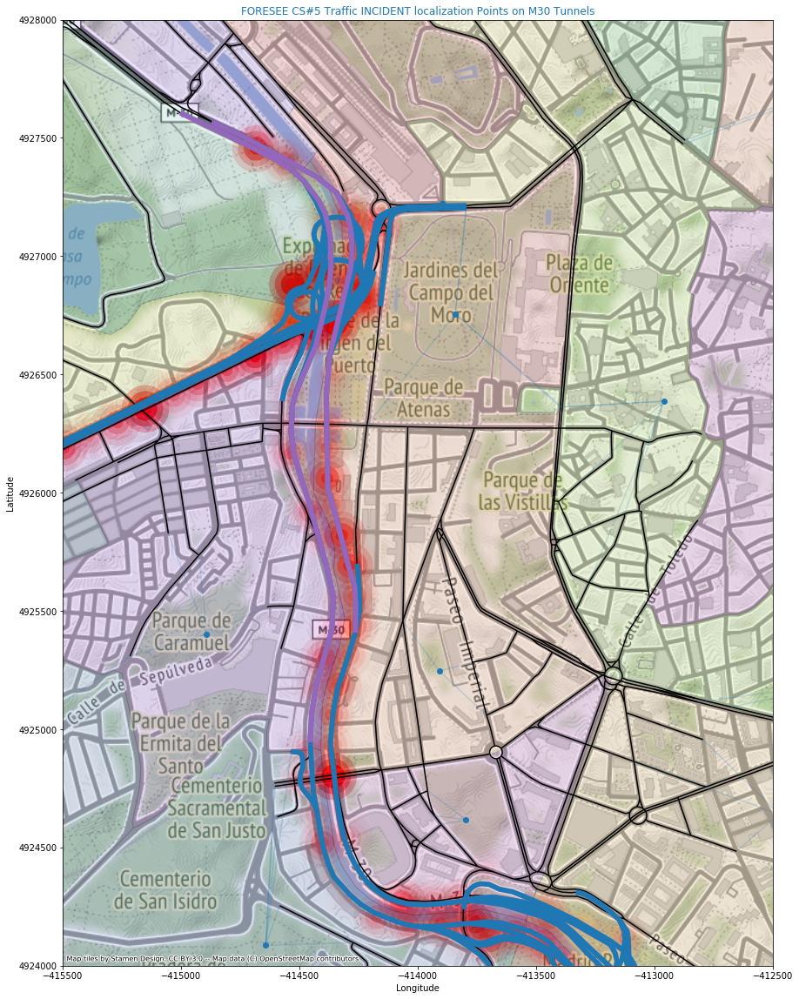

In [193]:
#Displaying the Tunnel Incident concentration points (please note not all are related to the risks of interest)
f, ax = plt.subplots(1, figsize=(20, 20))
ax.set_title('FORESEE CS#5 Historical Traffic INCIDENT localization Points on M30 Tunnels'.format('default'), color='C0')
ax.set_xlim(-415500,-412500)#(-3.775, -3.675)#(-3.8, -3.6)
ax.set_ylim(4924000,4928000)#(40.37, 40.48)#(40.35, 40.5)
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')

#Clio to Area of Interest
polygon = Polygon([(-415500,4928000), (-415500,4924000), (-412500,4924000), (-412500,4928000), (-415500,4928000)])
gdf_Incidents_clipped = gpd.clip(gdf_Incidents, polygon) #You need GeoPandas 0.7 to use clip
#Add buffer zones due to localization aproximation assumptions
buf1 = gdf_Incidents_clipped.buffer(25)
buf1.plot(ax=ax, color='red', alpha=0.05)
buf2 = gdf_Incidents_clipped.buffer(50)
buf2.plot(ax=ax, color='red', alpha=0.04)
buf3 = gdf_Incidents_clipped.buffer(75)
buf3.plot(ax=ax, color='red', alpha=0.02)
buf4 = gdf_Incidents_clipped.buffer(100)
buf4.plot(ax=ax, color='red', alpha=0.01)

#gdf_Incidents.apply(lambda x: ax.text(s=x['MC30'],
#                                        x=x.geometry.x,
#                                        y=x.geometry.y,
#                                        ha='center',
#                                        bbox={'facecolor': 'white', 'alpha':0.8, 'pad': 2, 'edgecolor':'none'})
#                      ,axis=1);

gdf_TM_network_link_3857.plot(ax=ax, edgecolor='black')#, column='Tipo', cmap="Pastel1", legend=True)#color='C1')
gdf_tunnels.plot(ax=ax, linewidth=6)#, linestyle=(0, (5, 2, 1, 2)))
gdf_tunnels_FORESEE_NB.plot(ax=ax, linewidth=6, color='C4')
gdf_tunnels_FORESEE_SB.plot(ax=ax, linewidth=6, color='C4')
#gdf_TM_network_node_3857.plot(ax=ax)
gdf_TM_network_zone_3857.plot(ax=ax, alpha=0.1,edgecolor='k', column='NO', cmap="prism")
gdf_TM_network_zone_centroid_3857.plot(ax=ax)
gdf_TM_network_connector_3857.plot(ax=ax, alpha=0.2)
ctx.add_basemap(ax, zoom=15)
plt.show()

In [157]:
#Heatmap of incident function
def heatmap(d, bins=(100,100), smoothing=1.3, cmap='jet'):
    def getx(pt):
        return pt.coords[0][0]

    def gety(pt):
        return pt.coords[0][1]

    x = list(d.geometry.apply(getx))
    y = list(d.geometry.apply(gety))
    heatmap, xedges, yedges = np.histogram2d(y, x, bins=bins)
    extent = [yedges[0], yedges[-1], xedges[-1], xedges[0]]

    logheatmap = np.log(heatmap)
    logheatmap[np.isneginf(logheatmap)] = 0
    logheatmap = ndimage.filters.gaussian_filter(logheatmap, smoothing, mode='nearest')
    
    plt.imshow(logheatmap, cmap=cmap, extent=extent)
    plt.colorbar()
    plt.gca().invert_yaxis()
    plt.show()



C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:14: RuntimeWarning: divide by zero encountered in log
  


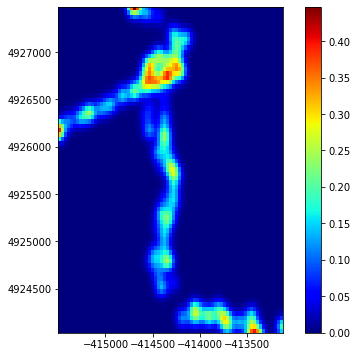

In [170]:
heatmap(gdf_Incidents_clipped, bins=75, smoothing=1.5)

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:31: RuntimeWarning: divide by zero encountered in log


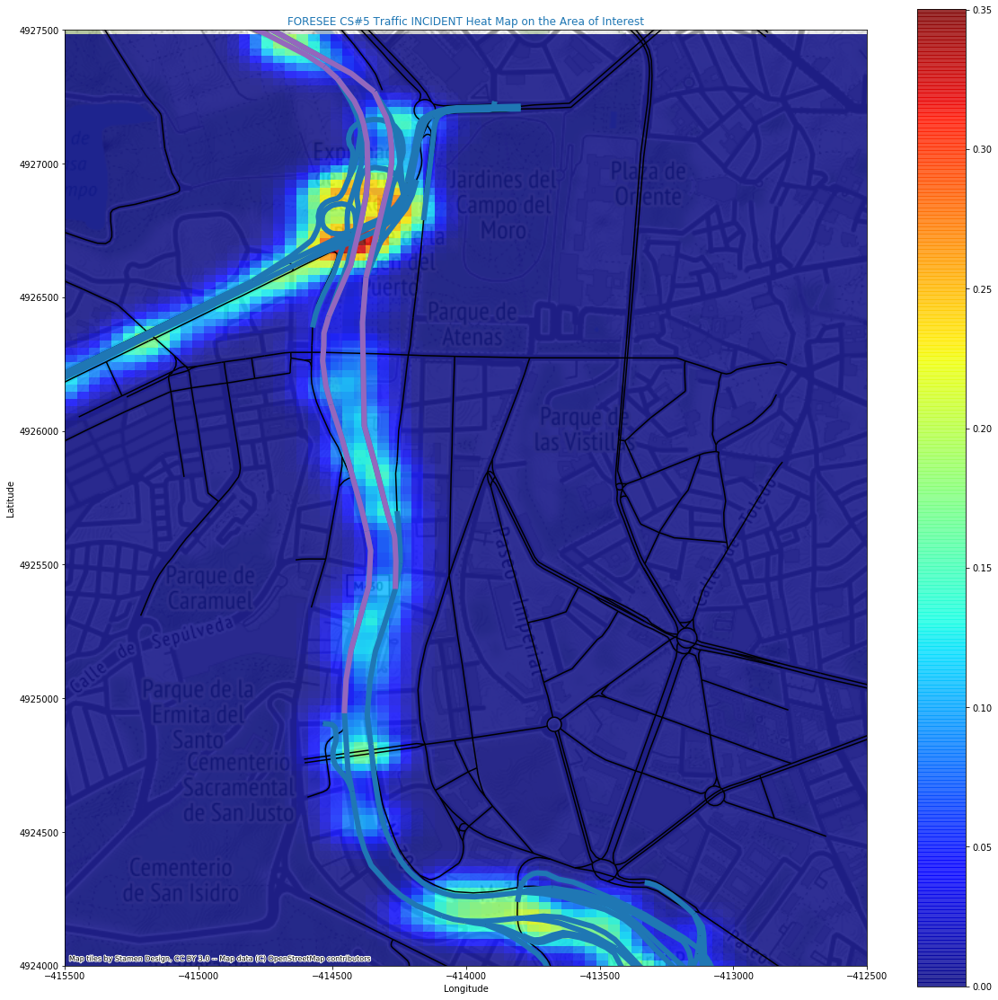

In [227]:
#Displaying the Tunnel CODES geodataframes
f, ax = plt.subplots(1, figsize=(20, 20))
ax.set_title('FORESEE CS#5 Traffic INCIDENT Heat Map on the Area of Interest'.format('default'), color='C0')
ax.set_xlim(-415500,-412500)#(-3.775, -3.675)#(-3.8, -3.6)
#ax.set_ylim(4924000,4928000)#(40.37, 40.48)#(40.35, 40.5)
ax.set_ylim(4924000,4927500)#(40.37, 40.48)#(40.35, 40.5)
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')

bins=220
smoothing=1.9

#Clip to Area of Interest
#polygon = Polygon([(-415500,4928000), (-415500,4924000), (-412500,4924000), (-412500,4928000), (-415500,4928000)])
polygon = Polygon([(-415500,4927500), (-415500,4924000), (-412500,4924000), (-412500,4927500), (-415500,4927500)])

gdf_Incidents_clipped = gpd.clip(gdf_Incidents, polygon) #You need GeoPandas 0.7 to use clip
#Add heat map
def getx(pt):
    return pt.coords[0][0]
def gety(pt):
    return pt.coords[0][1]
#x = list(gdf_Incidents_clipped.geometry.apply(getx))
#y = list(gdf_Incidents_clipped.geometry.apply(gety))
x = list(gdf_Incidents.geometry.apply(getx))
y = list(gdf_Incidents.geometry.apply(gety))
heatmap, xedges, yedges = np.histogram2d(y, x, bins=bins)
extent = [yedges[0], yedges[-1], xedges[-1], xedges[0]]
#print(extent)
#print(xedges)
logheatmap = np.log(heatmap)
logheatmap[np.isneginf(logheatmap)] = 0
logheatmap = ndimage.filters.gaussian_filter(logheatmap, smoothing, mode='nearest')
#logheatmap.plot(ax=ax, alpha=0.1, cmap='jet', extent=extent)#'numpy.ndarray' object has no attribute 'plot'
#plt.plot(logheatmap,ax=ax, alpha=0.1, cmap='jet', extent=extent)#'Line2D' object has no property 'ax'

#plt.gca().invert_yaxis()
  

gdf_TM_network_link_3857.plot(ax=ax, edgecolor='black')#, column='Tipo', cmap="Pastel1", legend=True)#color='C1')
gdf_tunnels.plot(ax=ax, linewidth=6)#, linestyle=(0, (5, 2, 1, 2)))
gdf_tunnels_FORESEE_NB.plot(ax=ax, linewidth=6, color='C4')
gdf_tunnels_FORESEE_SB.plot(ax=ax, linewidth=6, color='C4')
#gdf_TM_network_node_3857.plot(ax=ax)
##gdf_TM_network_zone_3857.plot(ax=ax, alpha=0.1,edgecolor='k', column='NO', cmap="prism")
##gdf_TM_network_zone_centroid_3857.plot(ax=ax)
##gdf_TM_network_connector_3857.plot(ax=ax, alpha=0.2)
ctx.add_basemap(ax, zoom=15)

plt.imshow(logheatmap, cmap='jet', extent=extent, alpha=0.8)
plt.colorbar()

plt.show()

In [243]:
gdf_Incidents_clipped['geometry'].head

<bound method NDFrame.head of 22      POINT (-414347.175 4926714.069)
23      POINT (-414347.175 4926714.069)
24      POINT (-414347.175 4926714.069)
25      POINT (-414347.175 4926714.069)
26      POINT (-414347.175 4926714.069)
                     ...               
1071    POINT (-413866.831 4924137.825)
1073    POINT (-413652.764 4924170.422)
1074    POINT (-413729.797 4924084.179)
1077    POINT (-414353.743 4927283.150)
1081    POINT (-414149.805 4927126.693)
Name: geometry, Length: 527, dtype: geometry>